<center><img src="https://github.com/hse-ds/iad-applied-ds/blob/master/2021/hw/hw1/img/logo_hse.png?raw=1" width="1000"></center>

<h1><center>Прикладные задачи анализа данных</center></h1>
<h2><center>Домашнее задание 3: прогнозирование временных рядов</center></h2>

**Мягкий дедлайн:** 23:59MSK 19.05.2024

**Жесткий дедлайн:** 23:59MSK 26.05.2024

## Введение

In [1]:
import os
import random
import warnings

warnings.filterwarnings("ignore")

import torch
import numpy
import pandas
import etna.models
import etna.metrics
import etna.pipeline
import etna.datasets
import etna.analysis
import etna.ensembles
import etna.transforms
import ruptures.detection
import etna.reconciliation

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(DEVICE)

RANDOM_STATE = 42
def set_random_seed(seed: int = RANDOM_STATE) -> None:
    random.seed(seed)
    numpy.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.deterministic = True

cuda


В данной задаче мы будем решать одну из актуальных практических задач, с которыми, в том числе, сталкиваются разработчики ETNA - прогнозирование объема необходимой наличности в банкоматах. Пожалуй, ни для кого не секрет, что отсутствие необходимой суммы в банкомате не делает клиента банка счастливее. В то же время, избыток заправленной в банкомат наличности приводит к упущенной выгоде - ведь, в конечном счете, эти деньги могли быть размещены в качестве краткосрочного депозита на межбанковском рынке. Для кредитной организации с обширной сетью банкоматов даже незначительное улучшение качества предсказания способно внести значительный вклад в прибыльность этой ветки бизнеса. 

В качестве инструмента воспользуемся библиотекой ETNA, документацию можно прочитать [тут](https://docs.etna.ai/stable/), и [чат](https://t.me/etna_support) комьюнити.

Мы будем использовать дневные данные реальных банкоматов для чего возьмем мультисегментный датасет.

In [2]:
df = pandas.read_csv('atms_daily_cash.csv', index_col = False)
kFreq = "D"

In [3]:
df["timestamp"] = pandas.to_datetime(df["datetime"])
df["target"] = df["operation_value"]
df["segment"] = df["atm_id"]
df = df[["timestamp", "segment", "target"]]

Полученные данные были просуммированы по банкоматам и дням эксплуатации, после чего залиты в gist, откуда мы и берем их.

Взглянем на то, что представляют из себя данные после этих действий:

In [4]:
df.head()

,timestamp,segment,target
0,2017-08-16,74,2.059266
1,2017-08-17,74,1.029633
2,2017-08-18,74,0.686422
3,2017-08-19,74,33.301267
4,2017-08-20,74,-12.237921


## Задание 1. EDA (1.75 балл)

Проведите разведывательный анализ данных с помощью `ETNA`- постройте графики, на которых можно судить о наличии тренда, сезонности и прочих зависимостей. Проанализируйте корреляции. Какие выводы вы можете сделать?

Ссылку на туториал по EDA можно найти [тут](https://docs.etna.ai/stable/tutorials/103-EDA.html#EDA). 

In [5]:
ts = etna.datasets.TSDataset(df, freq = kFreq)
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,3,20,0,0,0,D
101,2017-08-11,2018-09-30,416,3,20,0,0,0,D
102,2017-08-02,2018-09-30,425,3,20,0,0,0,D
103,2017-08-08,2018-09-30,419,3,20,0,0,0,D
104,2017-08-07,2018-09-30,420,3,20,0,0,0,D
105,2017-07-28,2018-09-30,430,3,20,0,0,0,D
106,2017-08-09,2018-09-30,418,3,20,0,0,0,D
74,2017-08-16,2018-09-30,411,3,20,0,0,0,D
85,2017-08-03,2018-09-30,424,3,20,0,0,0,D


In [6]:
N_SEGMENTS = 6
SEGMENTS = ts.segments[:N_SEGMENTS]

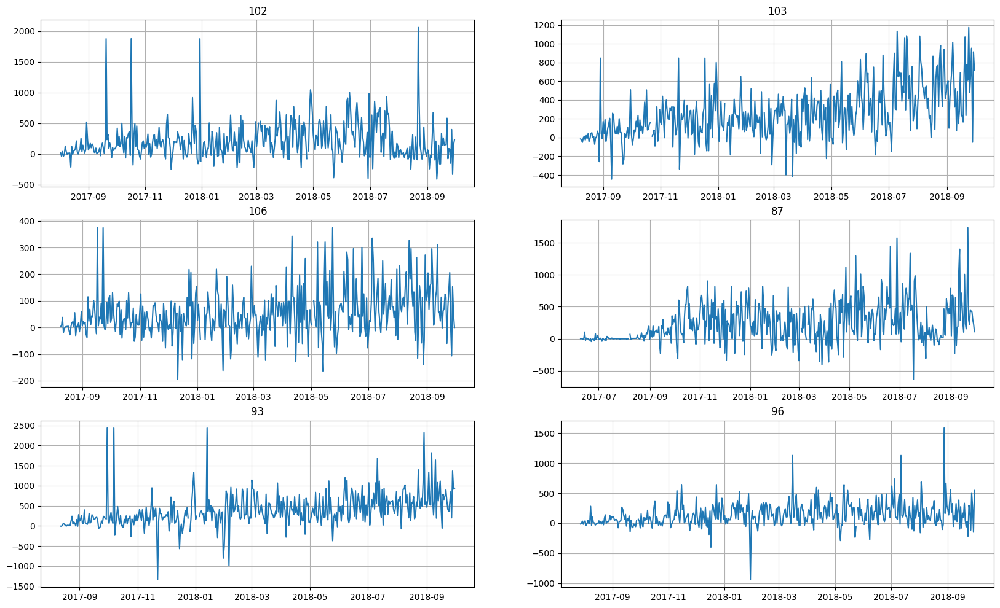

In [7]:
set_random_seed()
ts.plot(n_segments = N_SEGMENTS, figsize = (10, 4))

Какие-то закономерности видны, но в таком виде сформулировать их достаточно трудно.

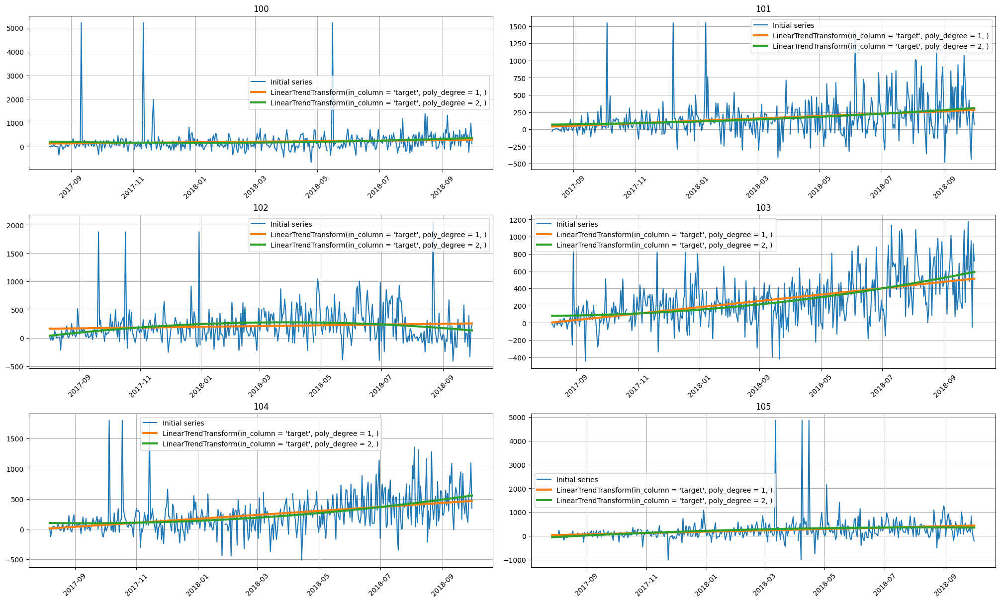

In [8]:
set_random_seed()
etna.analysis.plot_trend(ts, segments = SEGMENTS, figsize = (10, 4), trend_transform = [
    etna.transforms.LinearTrendTransform(in_column = "target", poly_degree = 1),
    etna.transforms.LinearTrendTransform(in_column = "target", poly_degree = 2),
])

Почти для всех компонент наблюдается возрастающий тренд.

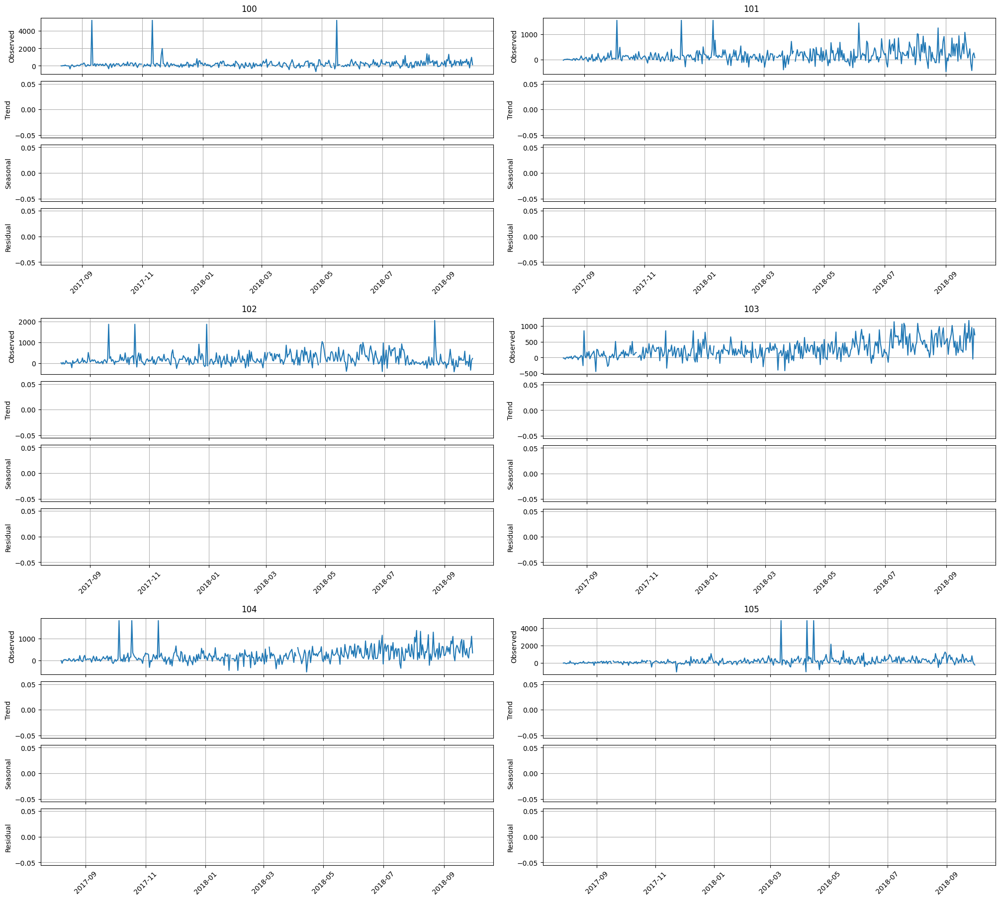

In [9]:
set_random_seed()
etna.analysis.stl_plot(ts, segments = SEGMENTS, figsize = (10, 6), period = 52)

In [10]:
try:
    etna.analysis.plot_time_series_with_change_points(
        ts, segments = SEGMENTS, figsize = (10, 2),
        change_points = etna.analysis.find_change_points(ts, 'target', change_point_model = ruptures.detection.Binseg(), pen = 1e5)
    )
except Exception as e:
    print(e)

The input column contains NaNs in the middle of the series! Try to use the imputer.


Periodogram can't be calculated on segment with NaNs inside: 100


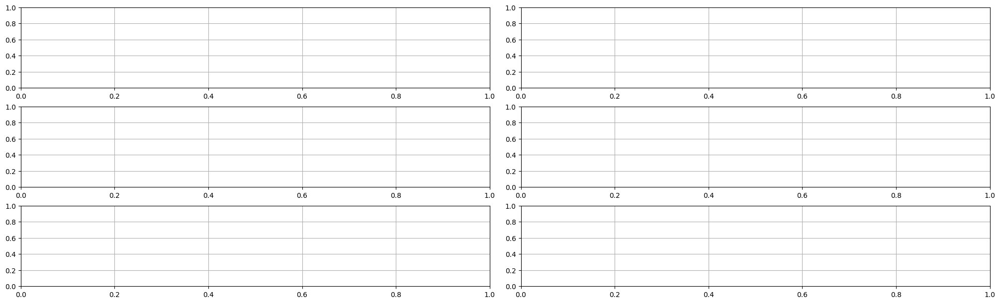

In [11]:
try:
    set_random_seed()
    etna.analysis.plot_periodogram(ts, period = 365.2425, amplitude_aggregation_mode = "per-segment", segments = SEGMENTS, figsize = (10, 2))
except Exception as e:
    print(e)

Ожиадемо, stl_plot (как и некоторые другие методы) не работают при наличии пропущенных значений в ряду. Посмотрим на результаты этих методов в следующем задании.

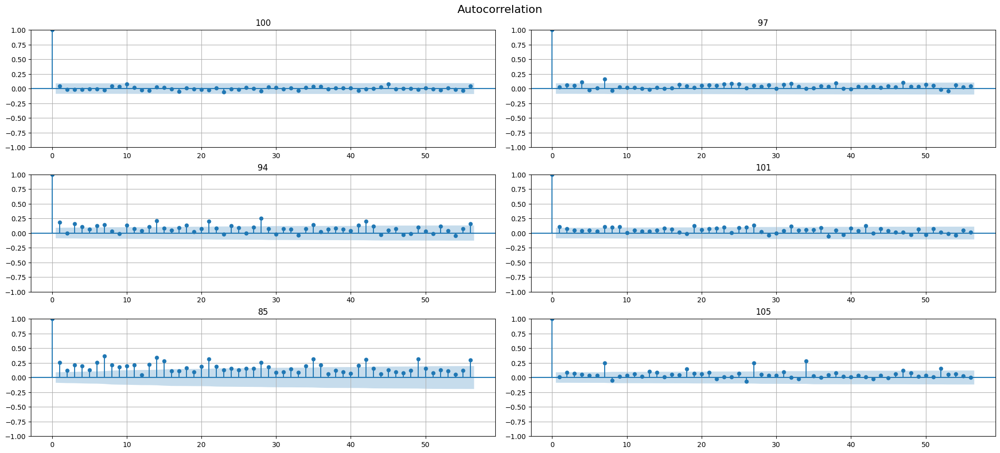

In [12]:
set_random_seed()
etna.analysis.acf_plot(ts, lags = 56, n_segments = N_SEGMENTS, figsize = (10, 3))

There is a NaN in the middle of the time series!


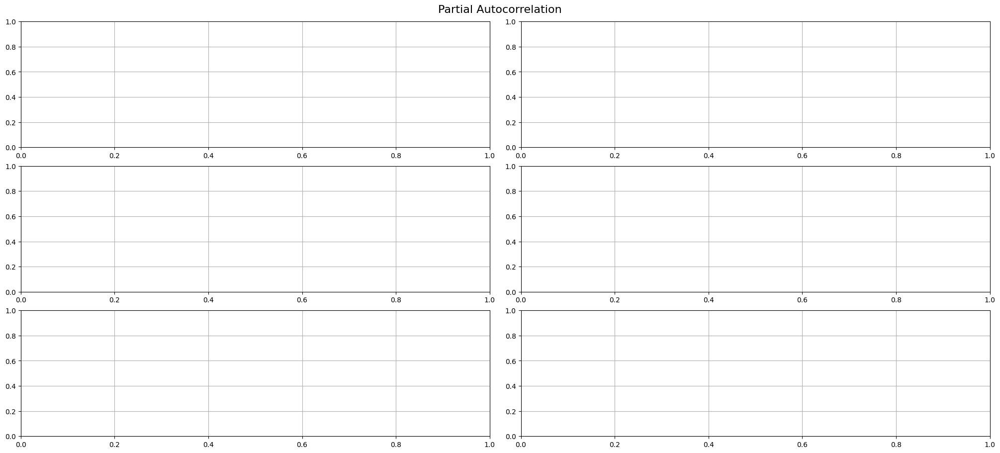

In [13]:
try:
    set_random_seed()
    etna.analysis.acf_plot(ts, lags = 56, partial = True, n_segments = N_SEGMENTS, figsize = (10, 3))
except Exception as e:
    print(e)

Видны пики с интервалом примерно в 7 дней. Это говорит о наличии недельной сезонности в данных, хотя она и не очень ярко выражена

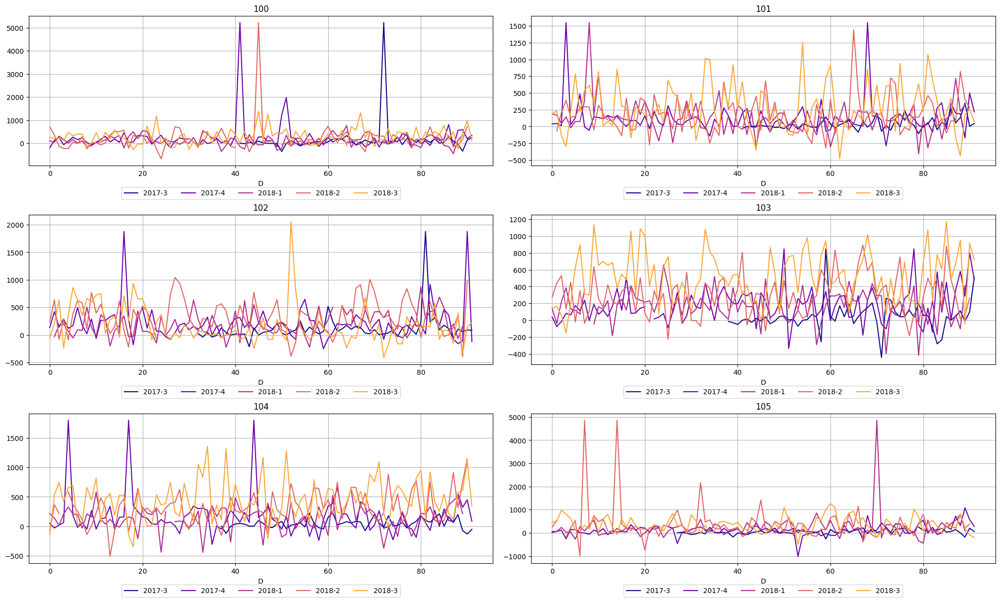

In [14]:
set_random_seed()
etna.analysis.seasonal_plot(ts, segments = SEGMENTS, figsize = (10, 4), cycle = "quarter")

Отдельные элементы сезонности действительно наблюдаются, хотя явные закономерности выделить и достаточно сложно.

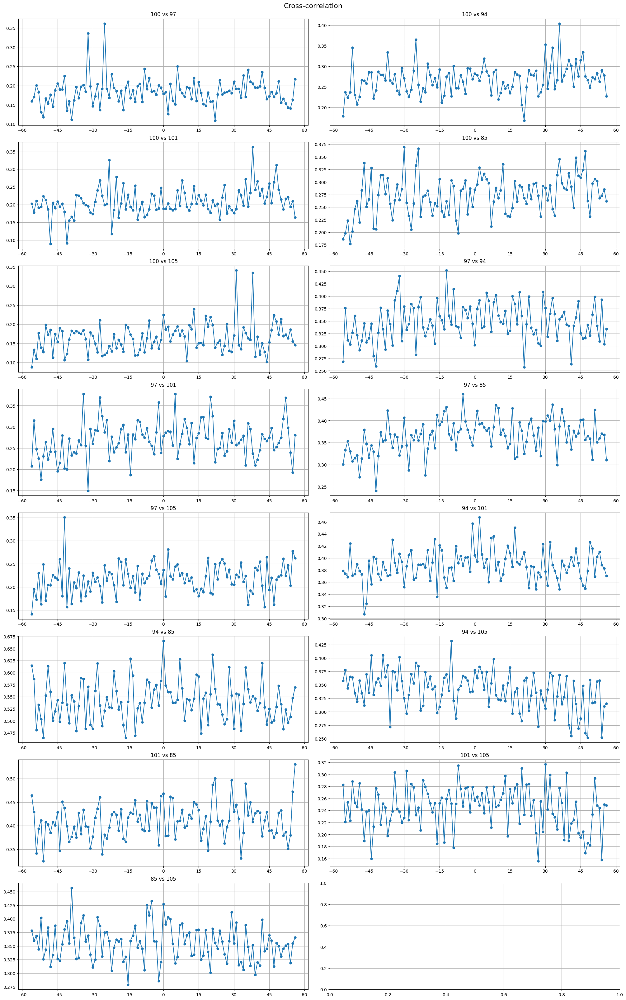

In [15]:
set_random_seed()
etna.analysis.cross_corr_plot(ts, n_segments = N_SEGMENTS, maxlags = 56, figsize = (10, 4))

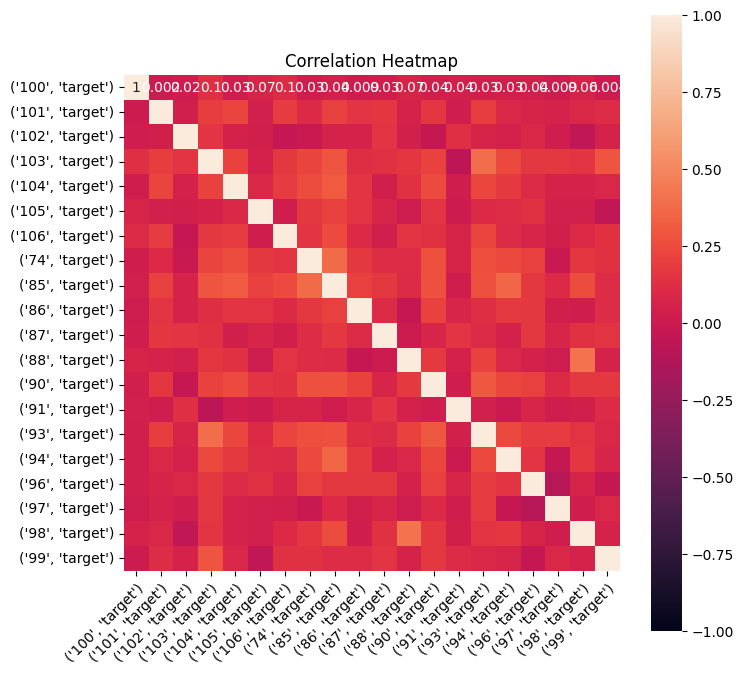

In [16]:
set_random_seed()
etna.analysis.plot_correlation_matrix(ts, figsize = (8, 8))

Кросс-корреляции также ненулевые: разные банкоматы имеют общие закономерности

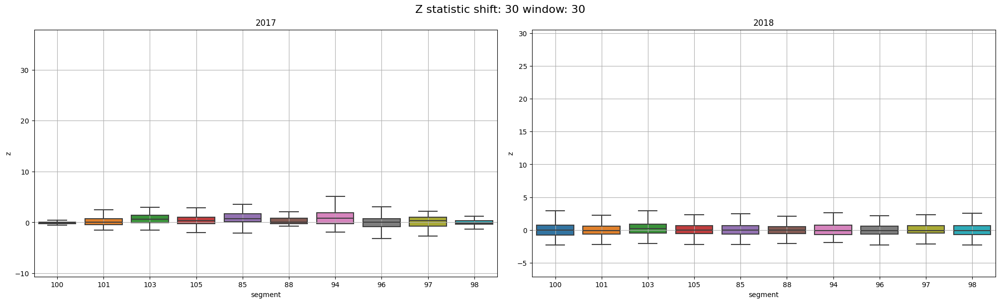

In [17]:
set_random_seed()
etna.analysis.distribution_plot(ts, figsize = (10, 6), freq = "1Y")

### Вывод

Таким образом:
1. В данных наблюдается недельная сезонность, хотя заметить это "на глаз" достаточно сложно.
2. Общий тренд для большинства банкоматов - небольшое возрастание количества выданной наличности.
3. Данные разных банкоматов заметно коррелированы, прослеживаются общие закономерности.
4. Многие методы ETNA не позволяет производить анализ временных рядов, содержащих пропущенные значения.

## Задание 2. Работа с пропущенными значениями и выбросами (1 балл)

Проанализируйте, есть ли в данных пропущенные значения, и подберите оптимальный метод их заполнения средствами ETNA. Какие методы вы выберете и почему? Совет: возможно, лучше сохранить заполненные данные в отдельный объект, поскольку некоторые модели заполняют пропуски встроенными методами, и подача на вход "сырых" данных (на языке временных рядов это данные с нерегулярными интервалами) может принести лучший результат.

Импорты всех необходимых компонент произведите самостоятельно.

In [18]:
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,3,20,0,0,0,D
101,2017-08-11,2018-09-30,416,3,20,0,0,0,D
102,2017-08-02,2018-09-30,425,3,20,0,0,0,D
103,2017-08-08,2018-09-30,419,3,20,0,0,0,D
104,2017-08-07,2018-09-30,420,3,20,0,0,0,D
105,2017-07-28,2018-09-30,430,3,20,0,0,0,D
106,2017-08-09,2018-09-30,418,3,20,0,0,0,D
74,2017-08-16,2018-09-30,411,3,20,0,0,0,D
85,2017-08-03,2018-09-30,424,3,20,0,0,0,D


Длительности записей для всех банкоматов разные, в то время как конечная дата совпадает. Следовательно, пропущенные значения есть в начале большинства записей. \
Более того, пропущенные значения есть и в самих записях: по 3 для каждого банкомата. Так как в данных наблюдается недельная сезонность, заполним их авторегрессивно. Таким образом должны получиться наиболее реалистичные данные, основанные на настоящем поведении ряда. Если сезонных данных недостаточно для заполнения (например, пропущено значение в начале записи), заполним оставшиеся пропущенные значения скользящим средним. Так как пропусков немного, выбор стратегии их заполнения не должен оказываться значимого влияния на результаты.

In [19]:
seasonal_imputer = etna.transforms.TimeSeriesImputerTransform(strategy = 'seasonal_nonautoreg', seasonality = 7)
running_mean_imputer = etna.transforms.TimeSeriesImputerTransform(strategy = 'running_mean')
ts_nona = running_mean_imputer.fit_transform(seasonal_imputer.fit_transform(etna.datasets.TSDataset(df, freq = kFreq)))
ts_nona.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,0,20,0,0,0,D
101,2017-08-11,2018-09-30,416,0,20,0,0,0,D
102,2017-08-02,2018-09-30,425,0,20,0,0,0,D
103,2017-08-08,2018-09-30,419,0,20,0,0,0,D
104,2017-08-07,2018-09-30,420,0,20,0,0,0,D
105,2017-07-28,2018-09-30,430,0,20,0,0,0,D
106,2017-08-09,2018-09-30,418,0,20,0,0,0,D
74,2017-08-16,2018-09-30,411,0,20,0,0,0,D
85,2017-08-03,2018-09-30,424,0,20,0,0,0,D


Завершим разведывательный анализ данных, используя методы, неприменимые к рядам с пропущенными значениями

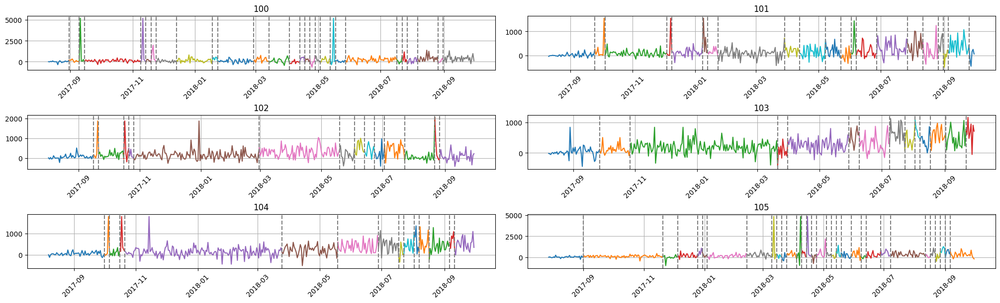

In [20]:
set_random_seed()
etna.analysis.plot_time_series_with_change_points(
    ts_nona, segments = SEGMENTS, figsize = (10, 2),
    change_points = etna.analysis.find_change_points(ts_nona, 'target', change_point_model = ruptures.detection.Binseg(), pen = 1e5)
)

Хотя общий тренд на возрастание и заметен, наблюдается большое количество локальных изменений тренда, что говорит о высокой хаотичности данных.

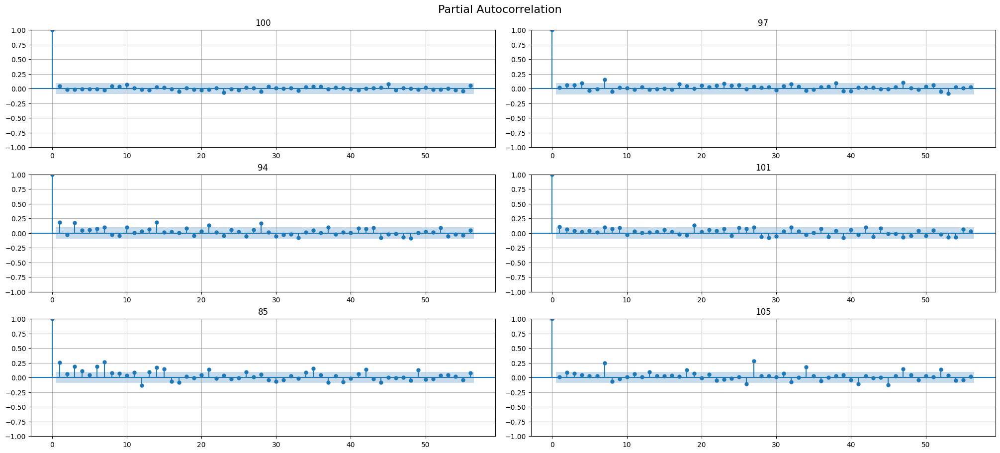

In [21]:
set_random_seed()
etna.analysis.acf_plot(ts_nona, lags = 56, partial = True, n_segments = N_SEGMENTS, figsize = (10, 3))

График частных автокорреляций также подтверждает недельную сезонность.

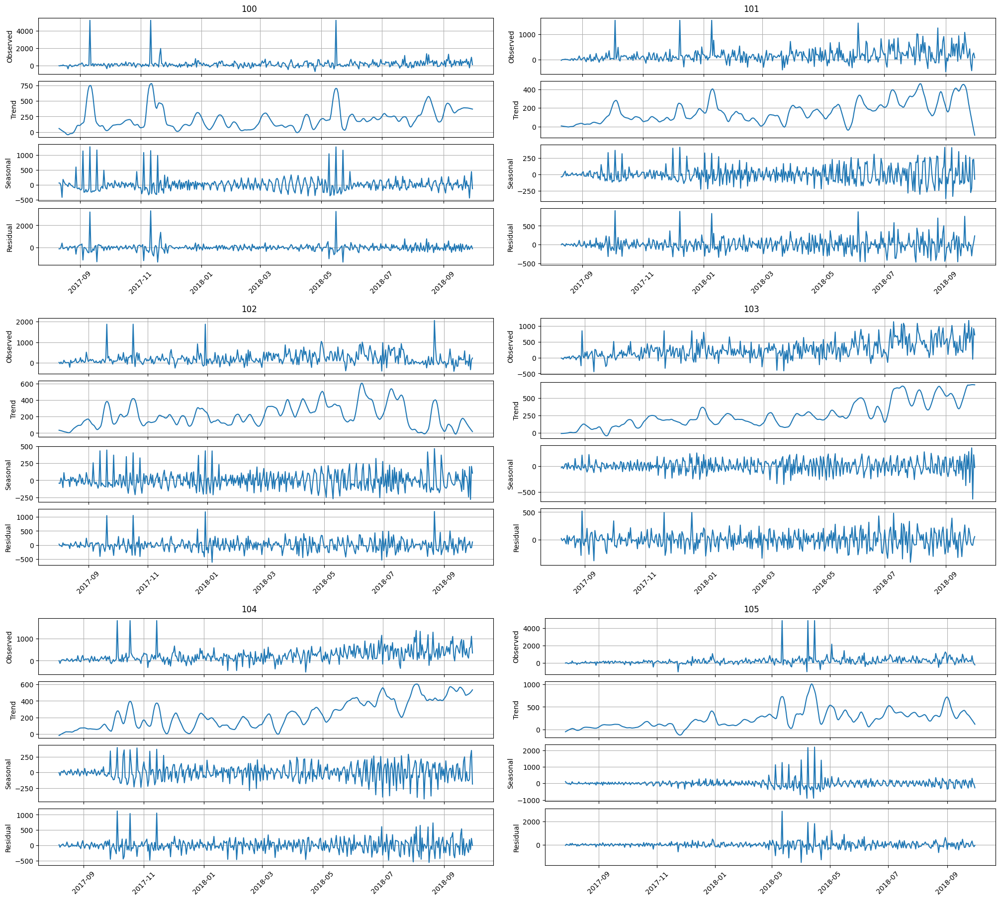

In [22]:
set_random_seed()
etna.analysis.stl_plot(ts_nona, segments = SEGMENTS, figsize = (10, 6), period = 7)

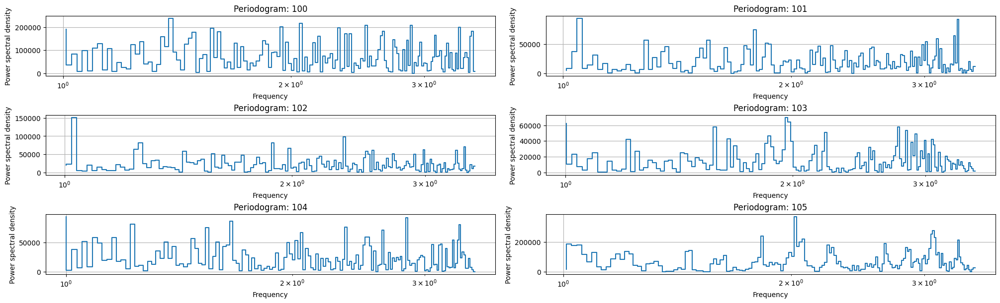

In [23]:
set_random_seed()
etna.analysis.plot_periodogram(ts_nona, period = 7, amplitude_aggregation_mode = "per-segment", segments = SEGMENTS, figsize = (10, 2))

Периоды проявляются, хотя и достаточно слабо.

Проверьте ряды на наличие выбросов, и очистите их соответствующим образом. Обоснуйте выбор.

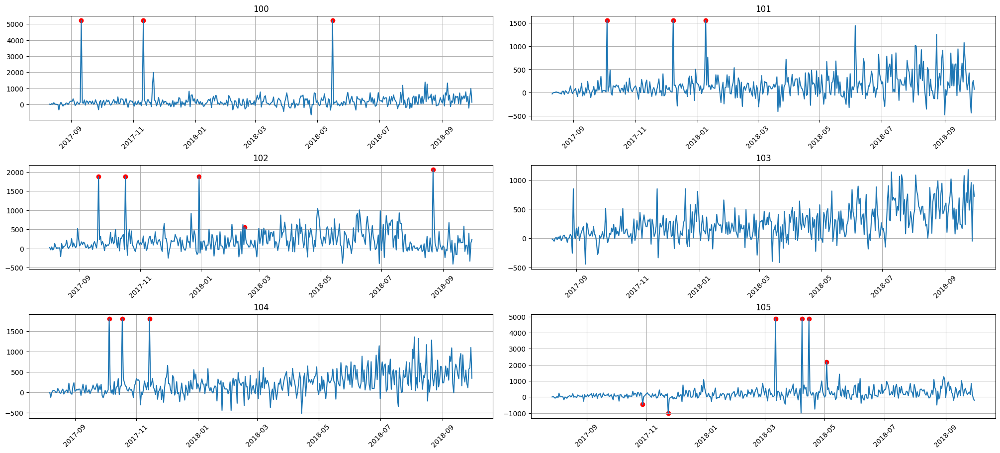

In [24]:
set_random_seed()
etna.analysis.plot_anomalies(ts_nona, etna.analysis.get_anomalies_median(ts_nona), segments = SEGMENTS, figsize = (10, 3))

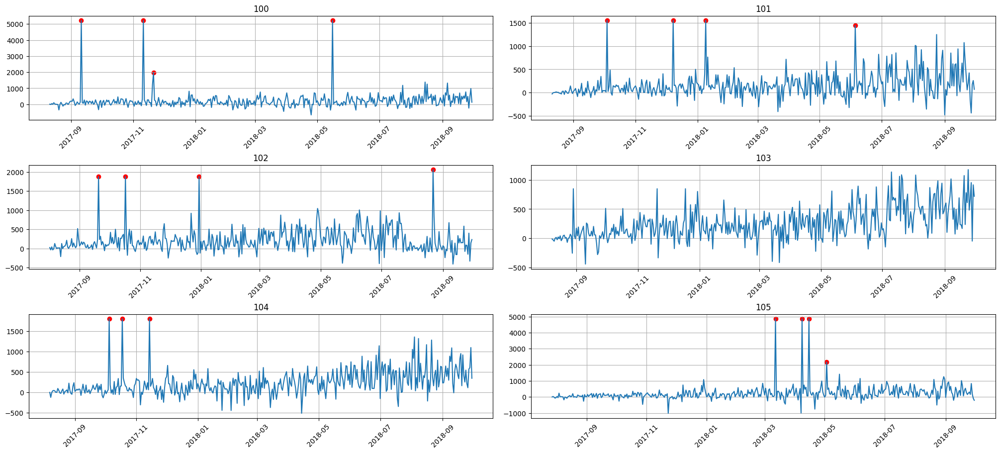

In [25]:
set_random_seed()
etna.analysis.plot_anomalies(ts_nona, etna.analysis.get_anomalies_density(ts_nona), segments = SEGMENTS, figsize = (10, 3))

В данных наблюдаются выбросы. Кажется, поиск на основе плотности точек работает неплохо при стандартных параметрах. Удалим найденные им выбросы.

In [26]:
outliers_remover = etna.transforms.DensityOutliersTransform("target")
ts_nona = outliers_remover.fit_transform(ts_nona)
ts_nona.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,4,20,0,0,0,D
101,2017-08-11,2018-09-30,416,4,20,0,0,0,D
102,2017-08-02,2018-09-30,425,4,20,0,0,0,D
103,2017-08-08,2018-09-30,419,0,20,0,0,0,D
104,2017-08-07,2018-09-30,420,3,20,0,0,0,D
105,2017-07-28,2018-09-30,430,4,20,0,0,0,D
106,2017-08-09,2018-09-30,418,0,20,0,0,0,D
74,2017-08-16,2018-09-30,411,3,20,0,0,0,D
85,2017-08-03,2018-09-30,424,0,20,0,0,0,D


Заполним образовавшиеся пропущенные значения так же, как раньше.

In [27]:
seasonal_imputer = etna.transforms.TimeSeriesImputerTransform(strategy = 'seasonal_nonautoreg', seasonality = 7)
running_mean_imputer = etna.transforms.TimeSeriesImputerTransform(strategy = 'running_mean')
ts_nona = running_mean_imputer.fit_transform(seasonal_imputer.fit_transform(etna.datasets.TSDataset(df, freq = kFreq)))
ts_nona.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,0,20,0,0,0,D
101,2017-08-11,2018-09-30,416,0,20,0,0,0,D
102,2017-08-02,2018-09-30,425,0,20,0,0,0,D
103,2017-08-08,2018-09-30,419,0,20,0,0,0,D
104,2017-08-07,2018-09-30,420,0,20,0,0,0,D
105,2017-07-28,2018-09-30,430,0,20,0,0,0,D
106,2017-08-09,2018-09-30,418,0,20,0,0,0,D
74,2017-08-16,2018-09-30,411,0,20,0,0,0,D
85,2017-08-03,2018-09-30,424,0,20,0,0,0,D


## Задание 3. Построение Prophet (1.25 балла)

Постройте прогнозы с помощью Prophet и `etna.Pipeline`, под капотом `etna.Pipeline` обучит `ProphetModel` для каждого сегмента в отдельности. После этого оцените качество по SMAPE на кросс-валидации. В качестве горизонта предсказания возьмите 5 дней - этого же горизонта будем придерживаться и в дальнейшем.

Отрисуйте получившийся прогноз.

In [28]:
HORIZON = 5

def do_backtest(
    pipeline: etna.pipeline.BasePipeline,
    ts: etna.datasets.TSDataset,
    metric: str = "MAE"
):
    match metric:
        case 'MAE':
            metrics = [ etna.metrics.MAE() ]
        case 'SMAPE':
            metrics = [ etna.metrics.SMAPE() ]
        case _:
            raise NotImplementedError(metric)
        
    set_random_seed()
    metrics_df, forecast_df, fold_info_df = pipeline.backtest(ts, metrics = metrics, aggregate_metrics = True, n_jobs = -1)
    display(metrics_df)
    print("Average: ", metrics_df[[metric]].mean().item())
    etna.analysis.plot_backtest(forecast_df, ts, history_len = 70, segments = SEGMENTS, figsize = (10, 3))

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.7s remaining:   23.5s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   21.6s remaining:   14.4s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   33.5s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.7s remaining:   22.1s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   21.9s remaining:   14.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   36.3s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.4s remaining:   21.6s
[Pa

,segment,SMAPE
0,100,84.451851
1,101,86.002763
2,102,97.592244
3,103,58.693653
4,104,53.087276
5,105,84.748578
6,106,86.166002
7,74,54.323794
8,85,55.372213
9,86,67.395499


Average:  75.31507666390999


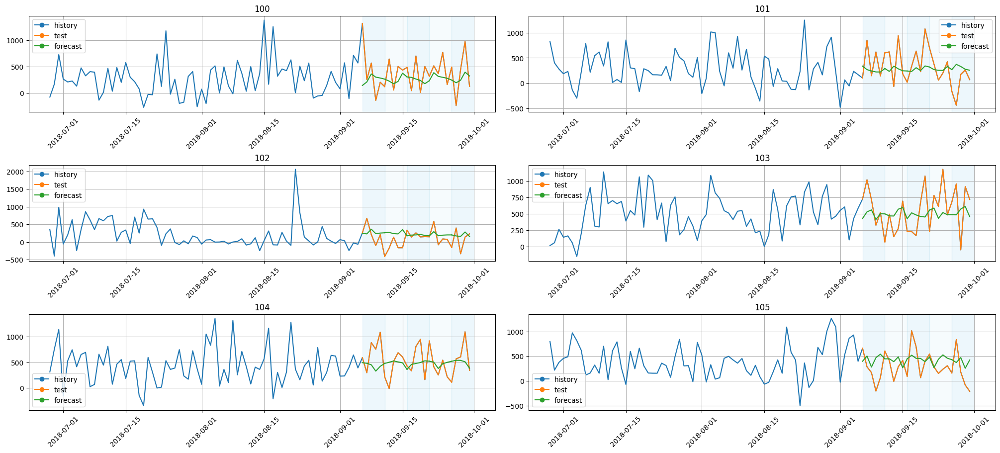

In [29]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.ProphetModel(), horizon = HORIZON),
    ts_nona, metric = 'SMAPE'
)

Исходя из статистики по каждому ряду, какой можно сделать вывод о том, как лучше предсказывать итоговое значение? Посчитайте то же самое исходя из MAE.

Результаты получились достаточно плохие, точные выводы сделать может быть сложно. Видно, что для некоторых банкоматов результат был предсказан относительно хорошо (ошибка чуть более 50%), но для других ошибка превысила 100%. Использование таких прогнозов может привести к излишним расходам. \
Попыткой невелирования этой проблемы может быть предсказание одного числа - общего количества средств в банкоматах - с дальнейшим пропорциональным разделением по каждому отдельному банкомату. Потенциальную эффективность такого подхода подтверждают и замеченные ранее корреляции между данными различных банкоматов. Общее количество выданных банкнот должно быть относительно стационарно в рассматриваемый период времени.

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.4s remaining:   23.1s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   21.3s remaining:   14.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   34.1s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.8s remaining:   22.2s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   21.8s remaining:   14.5s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   35.9s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.4s remaining:   21.7s
[Pa

,segment,MAE
0,100,276.631481
1,101,281.750208
2,102,223.209674
3,103,281.654715
4,104,252.853779
5,105,278.561516
6,106,73.930416
7,74,569.444885
8,85,261.032649
9,86,165.444434


Average:  264.7141740419721


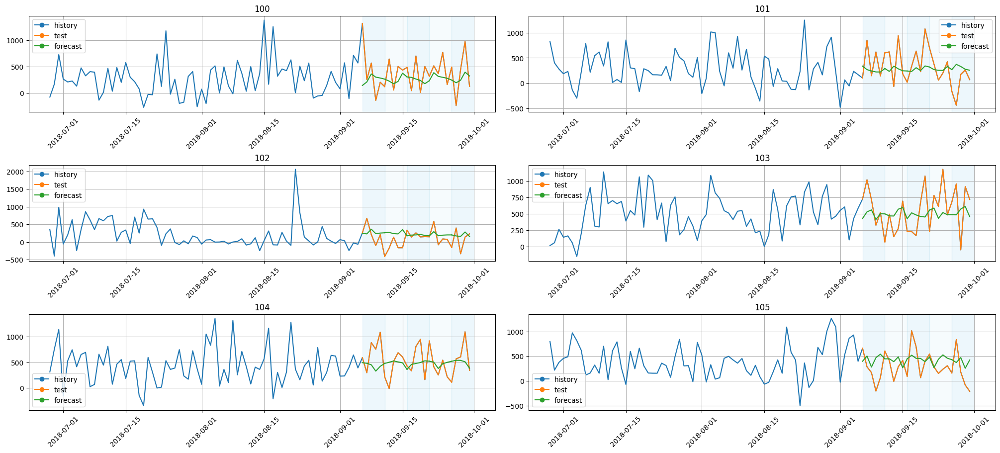

In [30]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.ProphetModel(), horizon = HORIZON),
    ts_nona
)

В результатах по MAE наблюдаются схожие закономерности.

## Задание 4. Иерархический временной ряд (2 балла)

Вопрос, поставленный в прошлом задании, тем не менее, естественным образом подводит нас к концепции **иерархического временного ряда** (когда один ряд состоит из других в качестве компонент). Это полезная концепция, которая может встретиться во многих задачах. В этом задании вам предстоит самостоятельно разобраться в деталях ее реализации в ETNA с использованием справочных материалов, предоставляемых библиотекой (как это часто бывает на практике). Они содержатся по следующей ссылке: https://github.com/etna-team/etna/blob/master/examples/303-hierarchical_pipeline.ipynb

На выходе из первой части задания необходимо получить `TSDataset` с иерархической структурой, а также соответствующий реконсилятор, который позволит собирать искомый ряд из составных компонент. Классы, которые вам понадобятся, импортированы ниже.

TopDownReconciliator библиотеки ETNA не поддерживает отрицательные значения целевой переменной. Так как использование других реализаций запрещено в настоящей работе, приведём значения к положительным "сдвигом" множества значений на 10000 - оценка максимального изменения количества средств в банкомате за сутки в течение изучаемого периода. Для этого прибавим 10000 ко всем значениям целевой переменной.

In [31]:
df[["target"]].abs().max()

target    8814.9103
dtype: float64

In [32]:
hierarchical_df = df.copy().rename(columns = { 'segment': 'atm' })
hierarchical_df[["target"]] += 10000

hierarchical_df, hierarchical_structure = etna.datasets.TSDataset.to_hierarchical_dataset(
    df = hierarchical_df, level_columns = ["atm"]
)
print(hierarchical_structure)

hierarchical_ts = etna.datasets.TSDataset(df = hierarchical_df, freq = kFreq, hierarchical_structure = hierarchical_structure)
display(hierarchical_ts)

HierarchicalStructure(level_structure = {'total': ['74', '85', '86', '87', '88', '90', '91', '93', '94', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106']}, level_names = ['total', 'atm'], )


segment,100,101,102,103,104,105,106,74,85,86,87,88,90,91,93,94,96,97,98,99
feature,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,
2017-06-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.617780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10001.441486,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9999.764655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9986.467683,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10007.398647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-26,10489.428602,9838.553575,9848.349796,10677.704316,10114.818767,10160.505046,10002.794718,12297.228473,10348.074726,10120.378785,10430.162938,10511.345072,10069.338415,10243.022761,10844.916685,10517.022761,9885.916685,10739.570539,10547.176294,10187.216663
2018-09-27,9760.507408,9561.199914,10398.467898,10953.351729,10568.916255,10836.297187,9893.212368,11693.304703,10846.975950,10367.520077,10420.081361,10382.935151,10351.575478,10374.727507,10199.748765,10753.397037,10504.549495,9735.649130,9764.390595,10560.208503


In [33]:
ahp_reconciliator = etna.reconciliation.TopDownReconciliator(
    target_level = "atm", source_level = "total", method = "AHP", period = 7
)
ahp_reconciliator.fit(hierarchical_ts)

TopDownReconciliator(target_level = 'atm', source_level = 'total', period = 7, method = 'AHP', )

In [34]:
pha_reconciliator = etna.reconciliation.TopDownReconciliator(
    target_level = "atm", source_level = "total", method = "PHA", period = 7
)
pha_reconciliator.fit(hierarchical_ts)

TopDownReconciliator(target_level = 'atm', source_level = 'total', period = 7, method = 'PHA', )

Во второй части задания примените найденные на предыдущих этапах преобразования очистку от выбросов уже к иерархическому датасету, и запустите на нем Prophet с MAE на кросс-валидации.

In [35]:
hierarchical_outliers_remover = etna.transforms.DensityOutliersTransform("target")
hierarchical_ts_nona = hierarchical_outliers_remover.fit_transform(hierarchical_ts)
hierarchical_ts_nona.hierarchical_structure

HierarchicalStructure(level_structure = {'total': ['74', '85', '86', '87', '88', '90', '91', '93', '94', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106']}, level_names = ['total', 'atm'], )

In [36]:
hierarchical_seasonal_imputer = etna.transforms.TimeSeriesImputerTransform(strategy = 'seasonal_nonautoreg', seasonality = 7)
hierarchical_running_mean_imputer = etna.transforms.TimeSeriesImputerTransform(strategy = 'running_mean')
hierarchical_ts_nona = hierarchical_running_mean_imputer.fit_transform(
    hierarchical_seasonal_imputer.fit_transform(
        etna.datasets.TSDataset(df = hierarchical_df, freq = kFreq, hierarchical_structure = hierarchical_structure)
    )
)
hierarchical_ts_nona.hierarchical_structure

HierarchicalStructure(level_structure = {'total': ['74', '85', '86', '87', '88', '90', '91', '93', '94', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106']}, level_names = ['total', 'atm'], )

In [37]:
hierarchical_ts_nona_total = hierarchical_ts_nona.get_level_dataset("total")

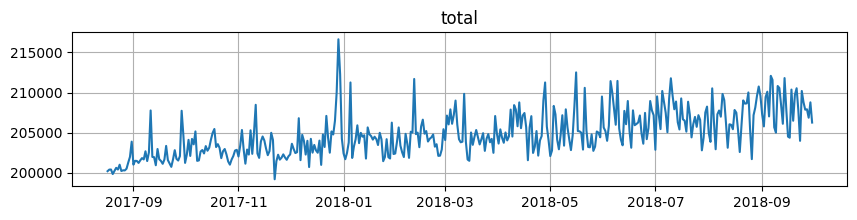

In [38]:
hierarchical_ts_nona_total.plot(figsize = (10, 2))

Ряд общего количества выданной наличности не стационарен.

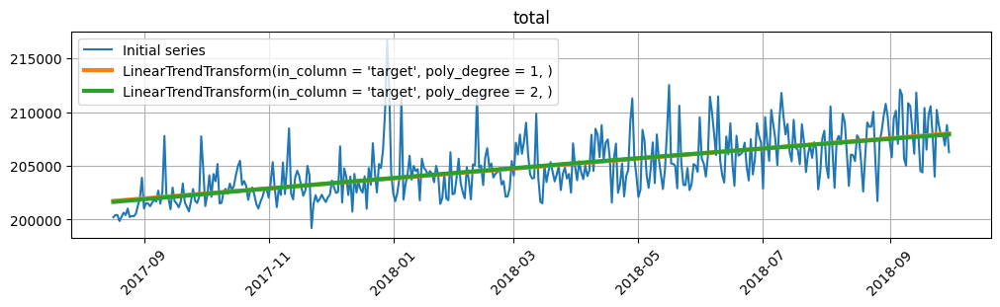

In [39]:
set_random_seed()
etna.analysis.plot_trend(hierarchical_ts_nona_total, figsize = (10, 3), trend_transform = [
    etna.transforms.LinearTrendTransform(in_column = "target", poly_degree = 1),
    etna.transforms.LinearTrendTransform(in_column = "target", poly_degree = 2),
])

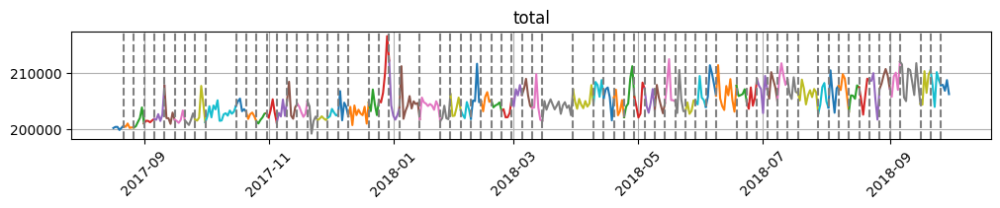

In [40]:
set_random_seed()
etna.analysis.plot_time_series_with_change_points(
    hierarchical_ts_nona_total, figsize = (10, 2),
    change_points = etna.analysis.find_change_points(hierarchical_ts_nona_total, 'target', change_point_model = ruptures.detection.Binseg(), pen = 1e5)
)

В нём также наблюдается возрастающий тренд, хотя и с большим количеством локальных точек перегиба

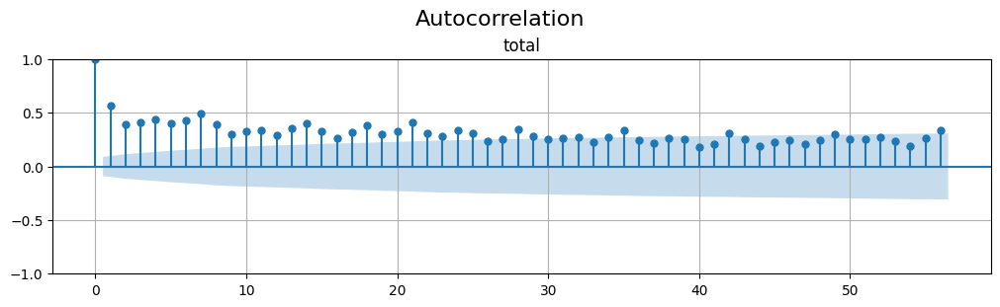

In [41]:
set_random_seed()
etna.analysis.acf_plot(hierarchical_ts_nona_total, lags = 56, figsize = (10, 3))

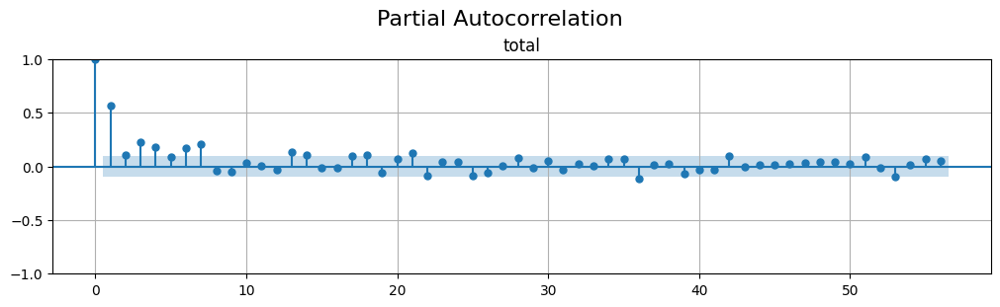

In [42]:
set_random_seed()
etna.analysis.acf_plot(hierarchical_ts_nona_total, lags = 56, partial = True, figsize = (10, 3))

Недельная сезонность также проявляется.

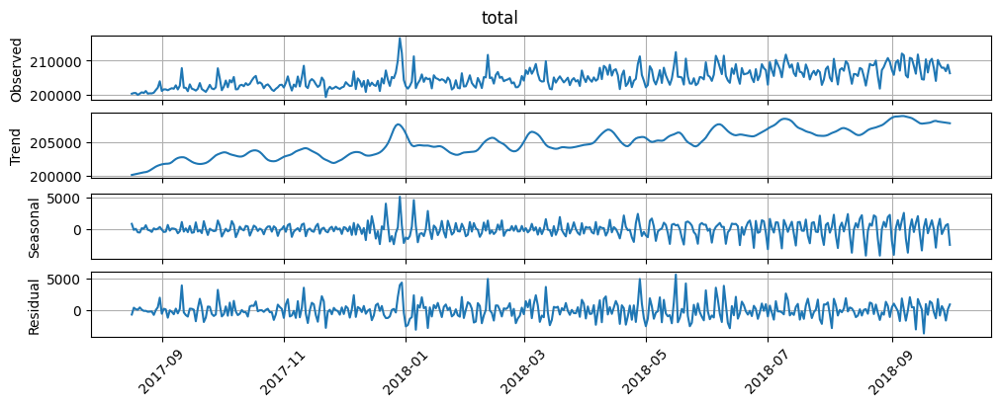

In [43]:
set_random_seed()
etna.analysis.stl_plot(hierarchical_ts_nona_total, figsize = (10, 4), period = 7)

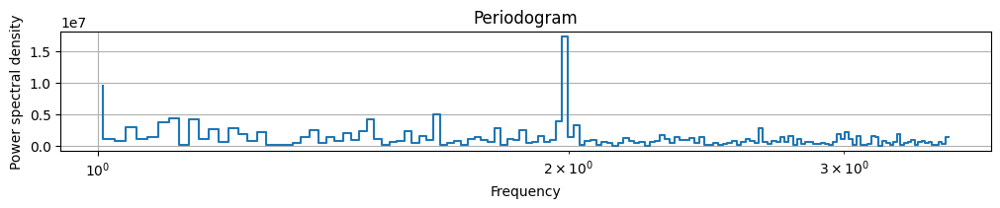

In [44]:
set_random_seed()
etna.analysis.plot_periodogram(hierarchical_ts_nona_total, period = 7, figsize = (10, 2))

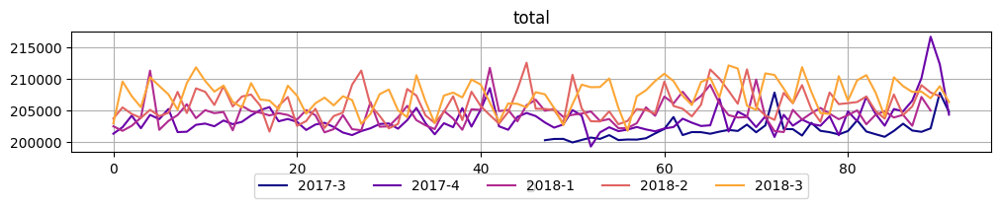

In [45]:
set_random_seed()
etna.analysis.seasonal_plot(hierarchical_ts_nona_total, figsize = (10, 2), cycle = "quarter")

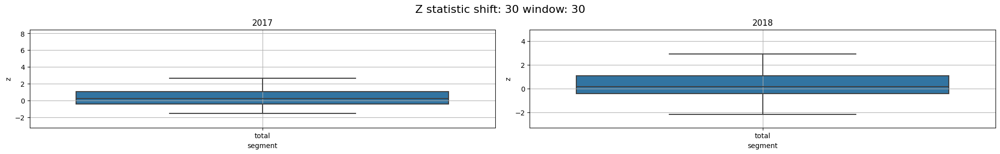

In [46]:
set_random_seed()
etna.analysis.distribution_plot(hierarchical_ts_nona_total, figsize = (10, 3), freq = "1Y")

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   12.3s remaining:   18.6s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   18.1s remaining:   12.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   29.8s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   11.8s remaining:   17.8s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   17.8s remaining:   11.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   29.9s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   12.5s remaining:   18.8s
[Pa

,segment,MAE
0,100,270.276199
1,101,310.638187
2,102,267.500821
3,103,281.303125
4,104,265.854136
5,105,293.107242
6,106,70.476497
7,74,741.879826
8,85,307.840652
9,86,178.071011


Average:  294.0855722432994


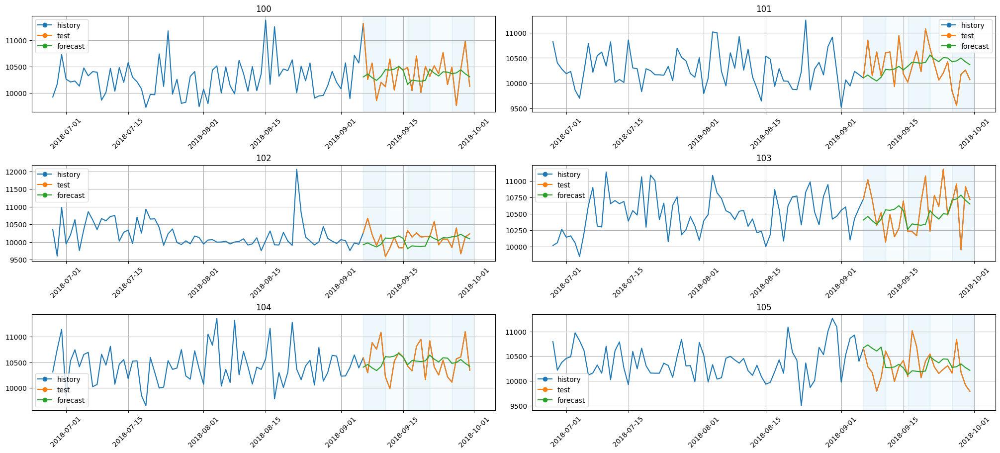

In [47]:
do_backtest(
    etna.pipeline.HierarchicalPipeline(model = etna.models.ProphetModel(), reconciliator = ahp_reconciliator, horizon = HORIZON),
    hierarchical_ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   13.0s remaining:   19.5s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   19.1s remaining:   12.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   30.9s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   11.9s remaining:   17.9s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   17.9s remaining:   11.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   30.3s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   12.3s remaining:   18.5s
[Pa

,segment,MAE
0,100,270.326997
1,101,311.025142
2,102,267.691869
3,103,281.440264
4,104,265.555808
5,105,293.218613
6,106,70.362394
7,74,743.067339
8,85,308.122540
9,86,178.191692


Average:  294.2615123492386


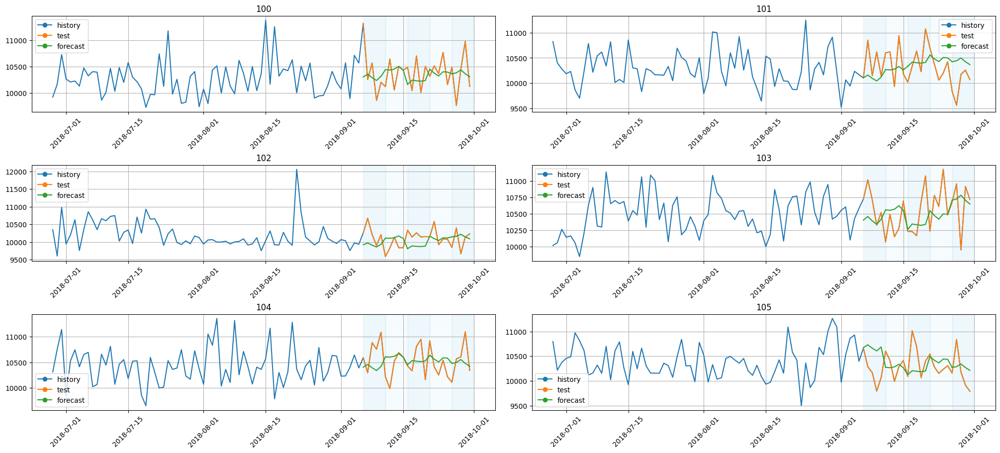

In [48]:
do_backtest(
    etna.pipeline.HierarchicalPipeline(model = etna.models.ProphetModel(), reconciliator = pha_reconciliator, horizon = HORIZON),
    hierarchical_ts_nona
)

Повышения качества не наблюдается :(

## Задание 5. Построение признаков (1.5 балла)

Вернемся к нашему исходному мультисегментному ряду - теперь поработаем с моделями, которые требуют построения признаков - `ARIMA` и `CatBoost`. Построим для них признаки, и попробуем при помощи них добиться улучшения качества. 

Из обязательного: 
1) постройте графики автокорреляции и при помощи них обоснуйте выбор лаговых признаков
2) для катбуста включите в признаки результаты STL разложения. STL используем для убирания тренда за счет преобразования на месте.
* Кроме этого, подумайте на экспертном уровне,
    - Какие еще закономерности могут присутствовать и почему?
    - Что из этого кажется более предсказуемым, и почему?
    - Cделайте соответствующие признаки, и снабдите их кратким комментарием.

3) После этого, обучите на получившихся признаках модели. Для `CatBoost` рассмотрите 2 версии мультисегментную и на каждый ряд в отдельности.

Ниже приведены импорты, которые вам точно понадобятся - к ним необходимо добавить те инструменты, которые вы дополнительно решите использовать в анализе.

Как было отмечено в заданиях 1 - 2, в данных наблюдается недельная сезонность (графики автокорреляций содержат пики с интервалом в 7 дней). Следовательно, целесообразно использовать 7 лаговых признаков, начиная с длины горизонта из-за особенностей реализации ETNA. \
 \
На экспертном уровне мне кажется, что в данных могут присутствовать следующие закономерности:
1. В выходные и праздничные дни людям обычно требуется больше денег на развлечения, из-за чего в такие дни и дни, предшествующие таковым, клиенты снимают из банкоматов больше средств. Для описания этих закономерностей добавим следующие признаки: \
    а. Бинарную переменную, является ли день выходным \
    б. Номер дня в неделе, что также является лаговым признаком для п. а \
    в. Бинарную переменную, является ли день праздничным \
    г. 7 лаговых признаков переменной, описанной в п. в, "в будущее": на неделе перед прздаником люди обычно покупают подарки, из-за чего им требуются деньги, которые они и получают в исследуемых банкоматах. К сожалению, ETNA не реализует такую возможность, а использование других библиотек в настоящей работе запрещено \
    д. 7 лаговых признаков переменной, описанной в п. в: после праздников у людей обычно мало денег, из-за чего сокращаются траты и, как следствие, со счетов снимается меньше наличности 
2. Летом люди обычно уходят в отпуск, что требует дополнительных расходов, и, как следствие, возрастает количество средств, снимаемых в банкоматах. Добавим признаки, показывающие номер месяца и сезона в году. 
3. В период выплаты заработных плат, скорее всего, количество выдаваемых банкнот также увеличивается. Хотя рзаные работодатели выплачивают заработные платы в разные дни, обычно это происходит в начале или в конце месяца. Детектировать это поможет признак, показывающий номер дня в месяце. 
4. Разные банкоматы выдают разное количество средств: банкоматы в крупных торговых центрах, очевидно, выдают больше наличности, чем банкоматы, расположенные в удалённых спальных районах. Хотя это, скорее всего, и не окажет значимого влияния на качество, добавим в датасет признак, кодирующий номер банкомата. 

 
В заключение, применим ко всем признакам стандартизацию - традиционный подход, позволяющий улучшить качество моделей

In [49]:
transforms = [
    etna.transforms.LagTransform(in_column = "target", lags = list(range(HORIZON, HORIZON + 7, 1))),
    etna.transforms.SegmentEncoderTransform(),
    etna.transforms.DateFlagsTransform(
        day_number_in_week = True,
        day_number_in_month = True,
        month_number_in_year = True,
        season_number = True,
        is_weekend = True,
        out_column = "dateflag"
    ),
    etna.transforms.HolidayTransform(out_column = 'is_holiday', mode = 'binary'),
    etna.transforms.LagTransform(in_column = "is_holiday", lags = list(range(1, 8, 1))),
    etna.transforms.StandardScalerTransform()
]
transforms = [
    etna.transforms.HolidayTransform(out_column = 'is_holiday', mode = 'binary'),
    etna.transforms.LagTransform(in_column = "is_holiday", lags = list(range(1, 8, 1))),
]
tmp = etna.datasets.TSDataset(ts_nona.df.copy(), freq = kFreq)
tmp.fit_transform(transforms)
tmp

segment                                                                        100  \
feature    LagTransform(in_column = 'is_holiday', lags = [1], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                                                  0                        
2017-06-11                                                  0                        
2017-06-12                                                  0                        
2017-06-13                                                  1                        
...                                                       ...                        
2018-09-26                                                  0                        
2018-09-27                                                  0                        
2018-09-28                                                  0                        
2018-09-29                                                  0                        
2018-09-30                                                  0                        

segment                                                                             \
feature    LagTransform(in_column = 'is_holiday', lags = [2], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                                                NaN                        
2017-06-11                                                  0                        
2017-06-12                                                  0                        
2017-06-13                                                  0                        
...                                                       ...                        
2018-09-26                                                  0                        
2018-09-27                                                  0                        
2018-09-28                                                  0                        
2018-09-29                                                  0                        
2018-09-30                                                  0                        

segment                                                                             \
feature    LagTransform(in_column = 'is_holiday', lags = [3], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                                                NaN                        
2017-06-11                                                NaN                        
2017-06-12                                                  0                        
2017-06-13                                                  0                        
...                                                       ...                        
2018-09-26                                                  0                        
2018-09-27                                                  0                        
2018-09-28                                                  0                        
2018-09-29                                                  0                        
2018-09-30                                                  0                        

segment                                                                             \
feature    LagTransform(in_column = 'is_holiday', lags = [4], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                               

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  2.2min remaining:  3.4min
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:  2.3min remaining:  1.5min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  2.8min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.9s remaining:   22.4s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   21.5s remaining:   14.3s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   34.6s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   13.3s remaining:   20.0s
[Pa

,segment,MAE
0,100,305.123182
1,101,290.020482
2,102,204.157667
3,103,283.254766
4,104,258.801664
5,105,264.309522
6,106,79.788660
7,74,697.197838
8,85,299.362764
9,86,186.846945


Average:  280.69976092479436


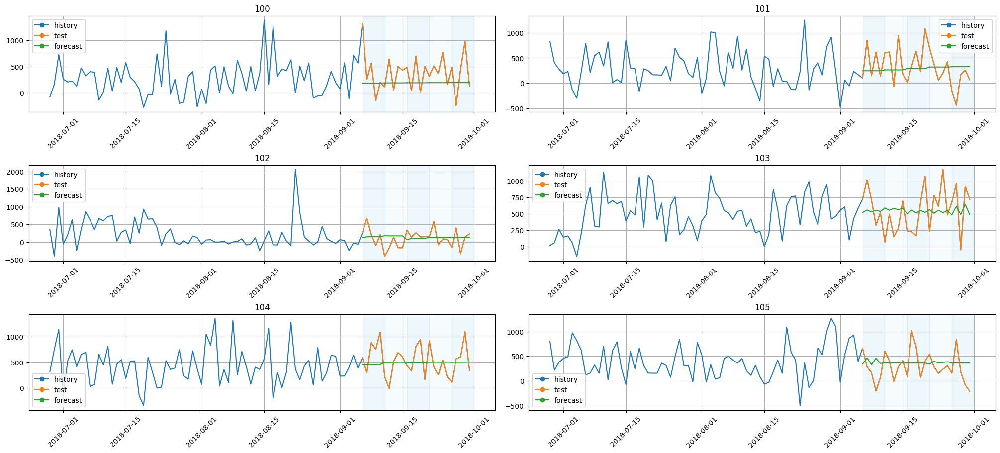

In [50]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.AutoARIMAModel(), transforms = transforms, horizon = HORIZON),
    ts_nona
)

In [51]:
stl = etna.transforms.STLTransform(in_column = "target", period = 7)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   17.2s remaining:   25.8s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   24.2s remaining:   16.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   37.7s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.7s remaining:   22.1s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   21.1s remaining:   14.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   33.6s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   13.1s remaining:   19.8s
[Pa

,segment,MAE
0,100,332.139243
1,101,401.559830
2,102,474.248469
3,103,380.427055
4,104,365.903647
5,105,302.755635
6,106,119.905102
7,74,814.120301
8,85,387.047966
9,86,216.492759


Average:  383.0238197954106


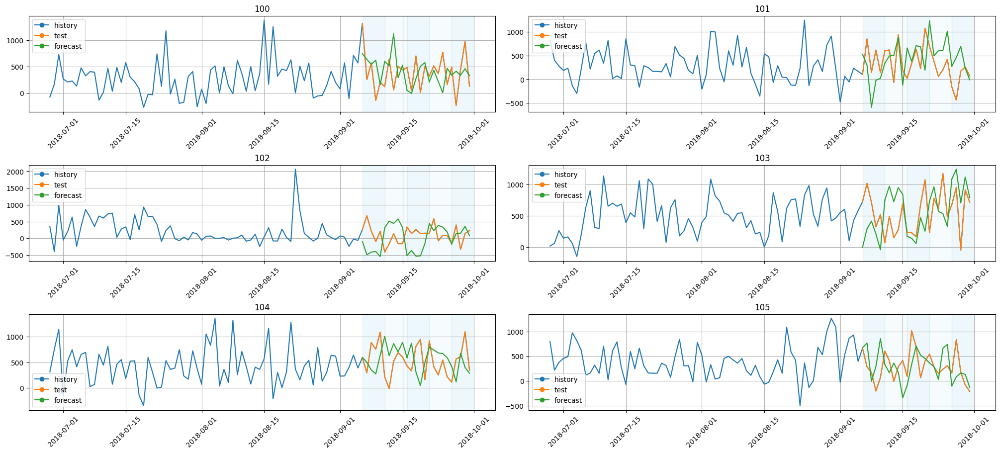

In [52]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.CatBoostMultiSegmentModel(), transforms = [ stl, *transforms ], horizon = HORIZON),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   23.0s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   32.1s remaining:   48.2s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   41.4s remaining:   27.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   58.1s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.1s remaining:   22.7s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   21.8s remaining:   14.5s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   35.0s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.2s remaining:   21.4s
[Pa

,segment,MAE
0,100,336.369218
1,101,402.325651
2,102,475.221651
3,103,381.050532
4,104,366.962465
5,105,302.934933
6,106,119.514435
7,74,814.337457
8,85,388.173387
9,86,216.361932


Average:  383.62370787091913


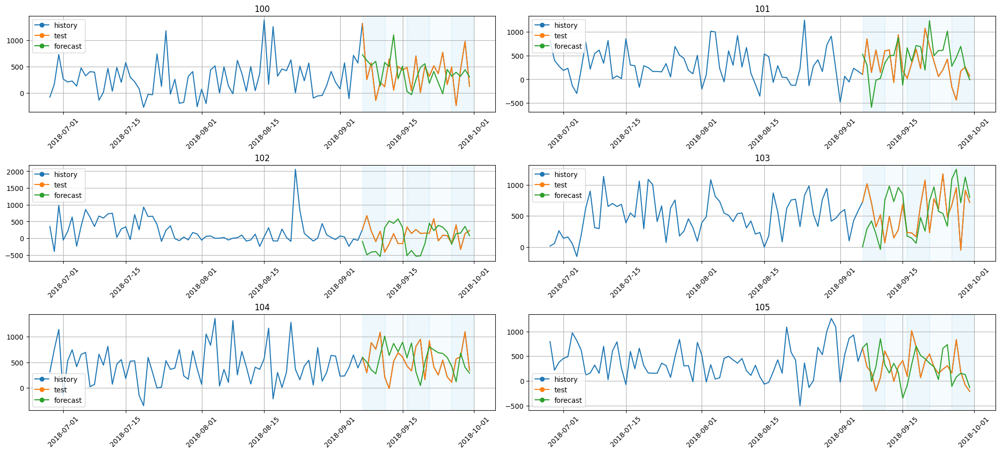

In [53]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.CatBoostPerSegmentModel(), transforms = [ stl, *transforms ], horizon = HORIZON),
    ts_nona
)

## Задание 6. Стратегии прогнозирования (1.25 балла)

Как нам известно по семинарским занятиям, при построении прогноза на горизонте дальше следующего наблюдения перед нами встает задача определиться со стратегией генерации прогноза. Попробуйте разные стратегии на нашем горизонте из 5 дней (прямая, рекурсивная). Какая стратегия в совокупности с какой моделью дает лучший результат?

Учитывайте особенности, которые некоторые стратегии могут накладывать на признаки (в частности, на лаговые переменные).

При необходимости, в смешанном методе пользуйтесь упрощенной схемой спецификации моделей/преобразований.

### Прямая, одна модель, без STL

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   22.2s remaining:   33.3s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   31.6s remaining:   21.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   49.3s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   22.3s remaining:   33.5s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   32.8s remaining:   21.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   54.8s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   21.1s remaining:   31.7s
[Pa

,segment,MAE
0,100,275.968028
1,101,280.795684
2,102,221.185031
3,103,279.781820
4,104,253.769802
5,105,277.042448
6,106,74.199183
7,74,569.982026
8,85,261.162930
9,86,164.325841


Average:  264.36276545006183


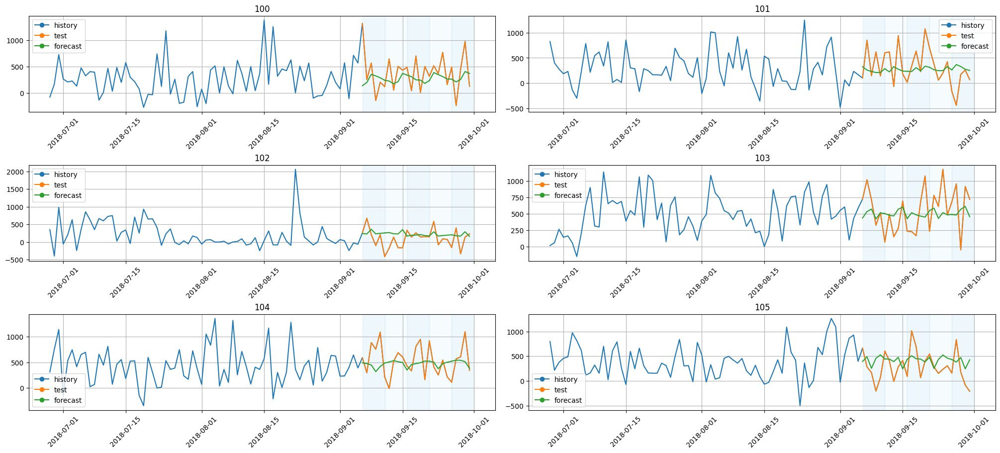

In [87]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.ProphetModel(), transforms = transforms, horizon = HORIZON),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  3.0min remaining:  4.5min
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:  3.0min remaining:  2.0min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  3.8min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   20.6s remaining:   31.0s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   29.6s remaining:   19.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   46.9s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   17.8s remaining:   26.7s
[Pa

,segment,MAE
0,100,305.123182
1,101,290.020482
2,102,204.157667
3,103,283.254766
4,104,258.801664
5,105,264.309522
6,106,79.788660
7,74,697.197838
8,85,299.362764
9,86,186.846945


Average:  280.69976092479436


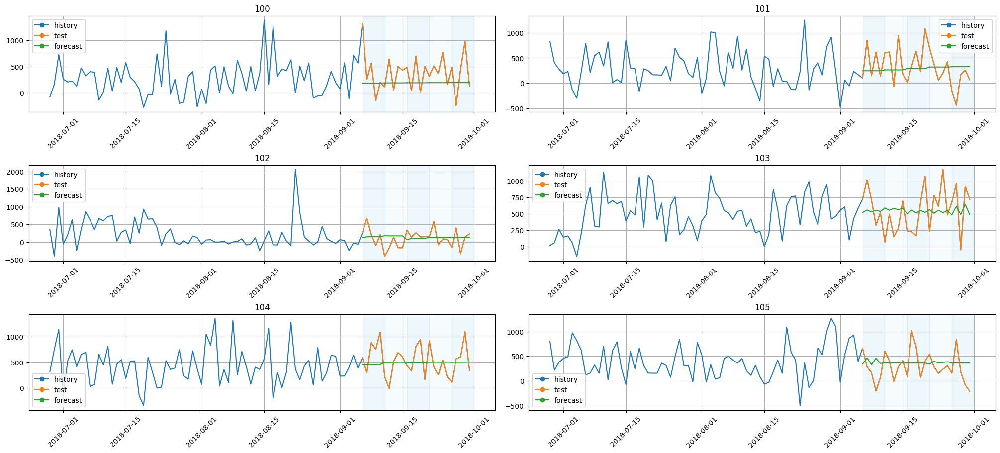

In [88]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.AutoARIMAModel(), transforms = transforms, horizon = HORIZON),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   21.9s remaining:   33.0s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   30.4s remaining:   20.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   46.2s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.5s remaining:   23.3s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   23.2s remaining:   15.5s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   37.6s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.8s remaining:   22.2s
[Pa

,segment,MAE
0,100,293.514065
1,101,280.532387
2,102,215.196497
3,103,370.818110
4,104,342.806305
5,105,236.300737
6,106,156.216284
7,74,1077.841484
8,85,399.706432
9,86,184.178523


Average:  327.76587720503255


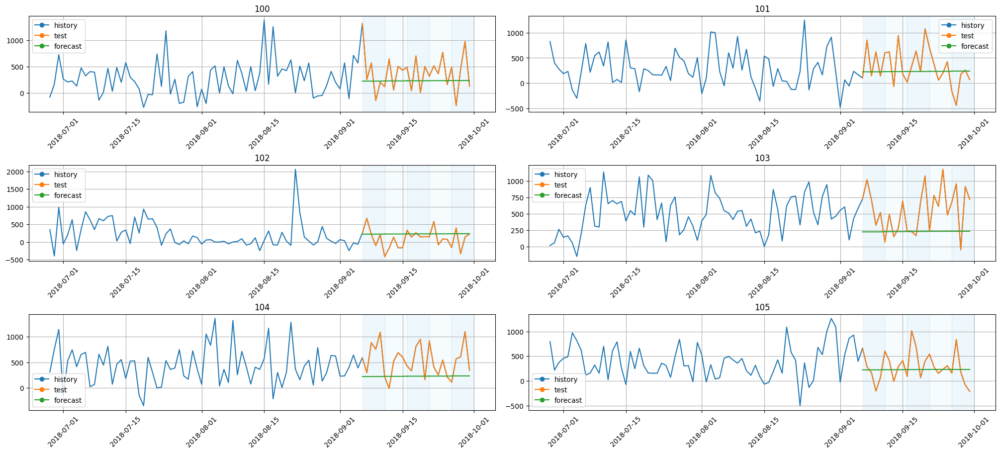

In [73]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.CatBoostMultiSegmentModel(), transforms = transforms, horizon = HORIZON),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   32.3s remaining:   48.5s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   43.2s remaining:   28.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.0min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.0s remaining:   22.5s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   22.6s remaining:   15.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   37.5s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   16.1s remaining:   24.2s
[Pa

,segment,MAE
0,100,308.079888
1,101,289.062209
2,102,206.820274
3,103,358.819086
4,104,338.872791
5,105,237.186118
6,106,75.402036
7,74,791.749761
8,85,361.047356
9,86,180.520503


Average:  304.25352386540163


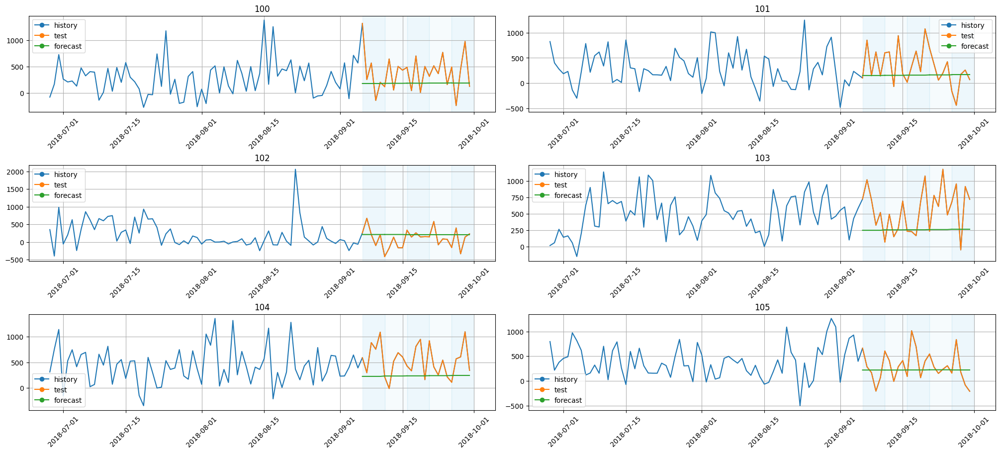

In [74]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.CatBoostPerSegmentModel(), transforms = transforms, horizon = HORIZON),
    ts_nona
)

### Прямая, одна модель, с STL

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   20.9s remaining:   31.4s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   30.2s remaining:   20.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   48.0s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   24.3s remaining:   36.6s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   34.5s remaining:   23.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   54.2s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   20.1s remaining:   30.2s
[Pa

,segment,MAE
0,100,331.877952
1,101,406.507917
2,102,480.266152
3,103,384.448505
4,104,365.625735
5,105,304.584342
6,106,120.552564
7,74,815.440625
8,85,391.084623
9,86,216.742134


Average:  384.89188239935106


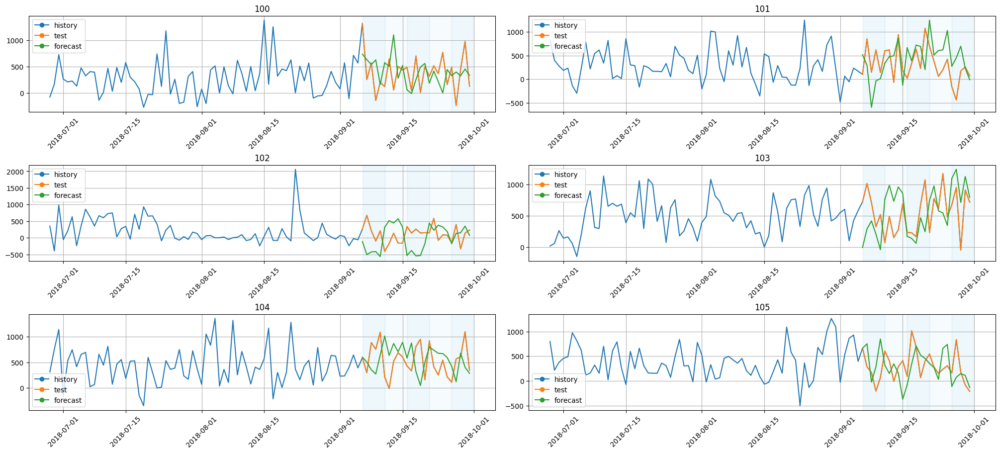

In [89]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.ProphetModel(), transforms = [ stl, *transforms ], horizon = HORIZON),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  4.7min remaining:  7.1min
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:  4.8min remaining:  3.2min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  5.4min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   21.2s remaining:   31.8s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   30.5s remaining:   20.3s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   48.8s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   18.3s remaining:   27.5s
[Pa

,segment,MAE
0,100,341.400516
1,101,404.778321
2,102,414.253701
3,103,345.149354
4,104,361.187462
5,105,289.605288
6,106,110.405761
7,74,788.691716
8,85,346.867842
9,86,214.667315


Average:  368.9003411162666


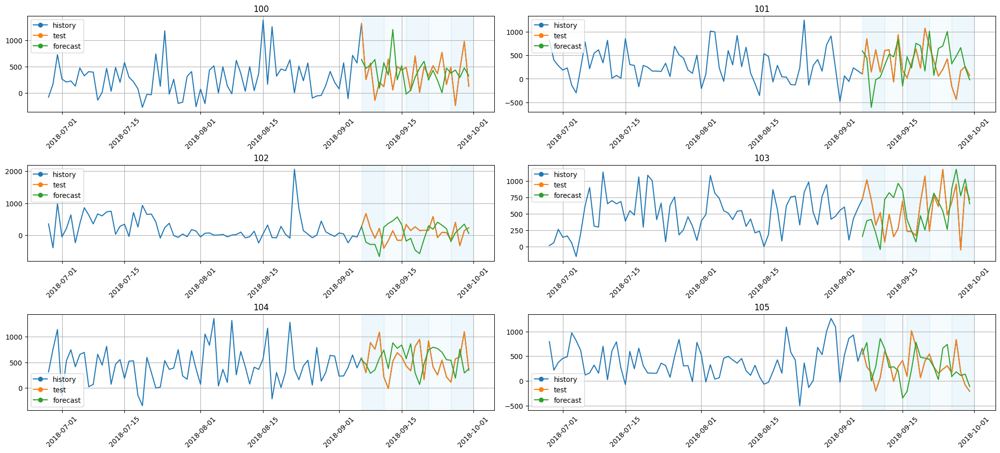

In [90]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.AutoARIMAModel(), transforms = [ stl, *transforms ], horizon = HORIZON),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   25.0s remaining:   37.6s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   34.0s remaining:   22.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   52.0s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   21.1s remaining:   31.7s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   28.6s remaining:   19.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   43.5s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.1s remaining:   22.8s
[Pa

,segment,MAE
0,100,332.139243
1,101,401.559830
2,102,474.248469
3,103,380.427055
4,104,365.903647
5,105,302.755635
6,106,119.905102
7,74,814.120301
8,85,387.047966
9,86,216.492759


Average:  383.0238197954106


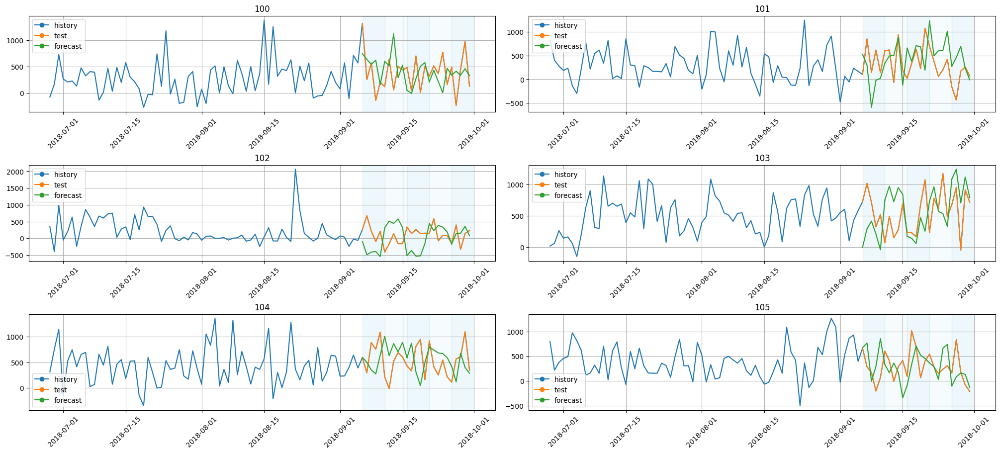

In [91]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.CatBoostMultiSegmentModel(), transforms = [ stl, *transforms ], horizon = HORIZON),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   26.8s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   36.3s remaining:   54.6s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   45.9s remaining:   30.5s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.1min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   16.3s remaining:   24.6s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   23.6s remaining:   15.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   37.7s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.5s remaining:   21.8s
[Pa

,segment,MAE
0,100,336.369218
1,101,402.325651
2,102,475.221651
3,103,381.050532
4,104,366.962465
5,105,302.934933
6,106,119.514435
7,74,814.337457
8,85,388.173387
9,86,216.361932


Average:  383.62370787091913


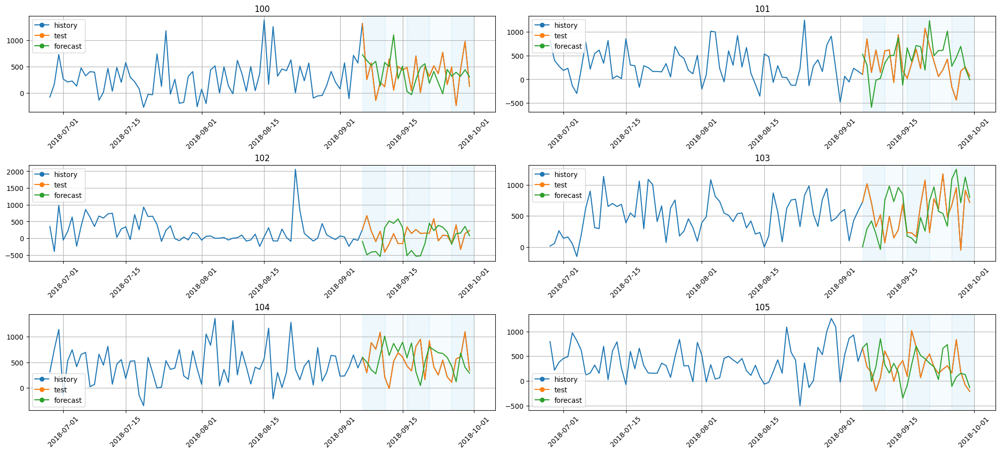

In [92]:
do_backtest(
    etna.pipeline.Pipeline(model = etna.models.CatBoostPerSegmentModel(), transforms = [ stl, *transforms ], horizon = HORIZON),
    ts_nona
)

### Прямая, 3 модели

In [54]:
horizons = [1, 3, 5]
transforms_many = [
    [
        etna.transforms.LagTransform(in_column = "target", lags = list(range(horizon, horizon + 7, 1)))
        for horizon in horizons
    ],
    etna.transforms.SegmentEncoderTransform(),
    etna.transforms.DateFlagsTransform(
        day_number_in_week = True,
        day_number_in_month = True,
        month_number_in_year = True,
        season_number = True,
        is_weekend = True,
        out_column = "dateflag"
    ),
    etna.transforms.HolidayTransform(out_column = 'is_holiday', mode = 'binary'),
    etna.transforms.LagTransform(in_column = "is_holiday", lags = list(range(1, 8, 1))),
    etna.transforms.StandardScalerTransform()
]

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   27.0s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   36.3s remaining:   54.6s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   45.2s remaining:   30.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.0min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   30.2s remaining:   45.3s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   42.1s remaining:   28.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.1min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   24.4s remaining:   36.6s
[Pa

,segment,MAE
0,100,257.720503
1,101,291.800770
2,102,222.868995
3,103,270.252343
4,104,242.405187
5,105,249.650062
6,106,80.517414
7,74,568.622339
8,85,252.864517
9,86,165.849582


Average:  266.6125828959674


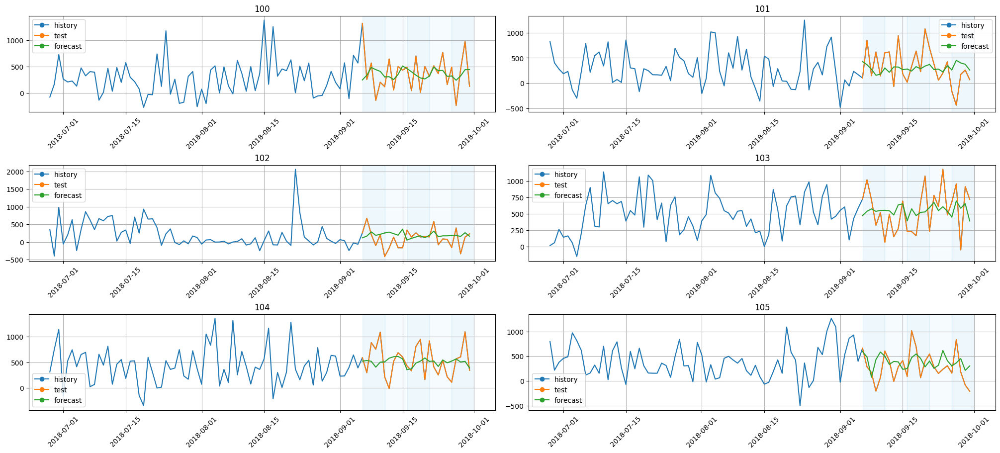

In [75]:
models = [ etna.models.ProphetModel() for _ in horizons ]
do_backtest(
    etna.ensembles.DirectEnsemble(
        pipelines = etna.pipeline.assemble_pipelines(models = models, transforms = transforms_many, horizons = horizons),
        n_jobs = -1
    ),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  8.4min remaining: 12.6min
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:  8.6min remaining:  5.7min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  9.3min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   23.8s remaining:   35.7s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   32.6s remaining:   21.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   48.7s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.8s remaining:   23.7s
[Pa

,segment,MAE
0,100,276.003442
1,101,302.498944
2,102,207.471714
3,103,310.645072
4,104,276.302546
5,105,248.173156
6,106,77.531645
7,74,564.611965
8,85,285.122700
9,86,180.329440


Average:  275.75552341024826


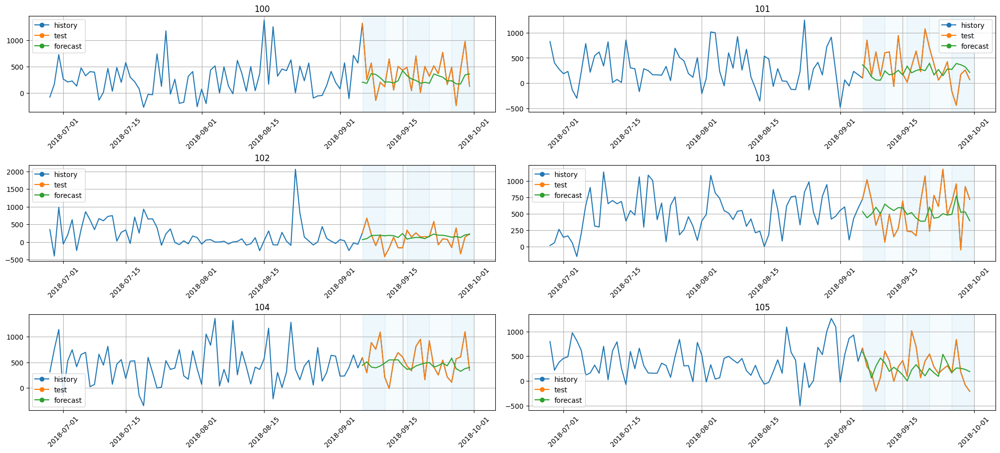

In [55]:
models = [ etna.models.AutoARIMAModel() for _ in horizons ]
do_backtest(
    etna.ensembles.DirectEnsemble(
        pipelines = etna.pipeline.assemble_pipelines(models = models, transforms = transforms_many, horizons = horizons),
        n_jobs = -1
    ),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   25.1s remaining:   37.8s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   34.6s remaining:   23.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   52.6s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   17.4s remaining:   26.2s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   25.8s remaining:   17.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   41.6s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.9s remaining:   23.8s
[Pa

,segment,MAE
0,100,264.387031
1,101,276.574558
2,102,246.471487
3,103,325.415788
4,104,267.823856
5,105,261.639327
6,106,86.022091
7,74,686.191128
8,85,309.946531
9,86,160.555319


Average:  282.85543567957063


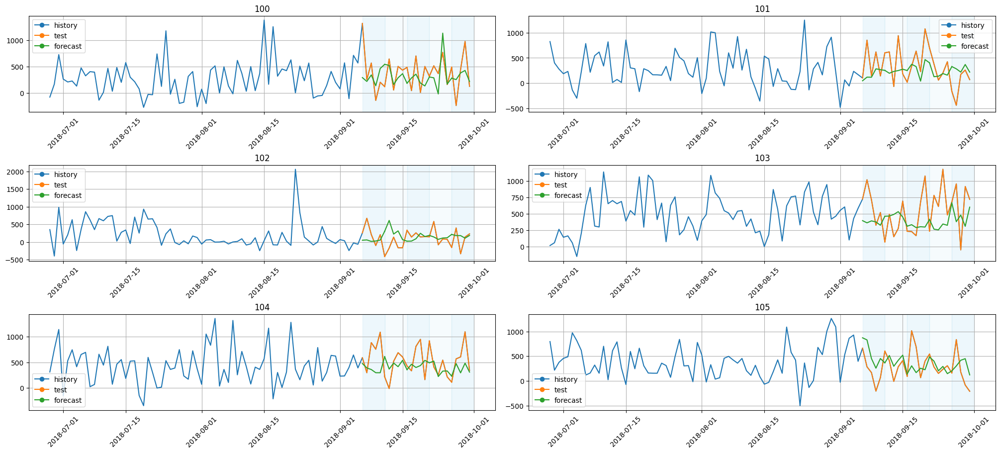

In [56]:
models = [ etna.models.CatBoostMultiSegmentModel() for _ in horizons ]
do_backtest(
    etna.ensembles.DirectEnsemble(
        pipelines = etna.pipeline.assemble_pipelines(models = models, transforms = transforms_many, horizons = horizons),
        n_jobs = -1
    ),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  2.7min remaining:  4.1min
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:  2.9min remaining:  1.9min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  3.2min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   17.9s remaining:   26.9s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   25.5s remaining:   17.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   41.8s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   16.2s remaining:   24.3s
[Pa

,segment,MAE
0,100,308.832132
1,101,315.878340
2,102,290.422307
3,103,304.535510
4,104,322.126881
5,105,291.600155
6,106,94.082071
7,74,587.367844
8,85,342.400231
9,86,184.107856


Average:  292.3396975477533


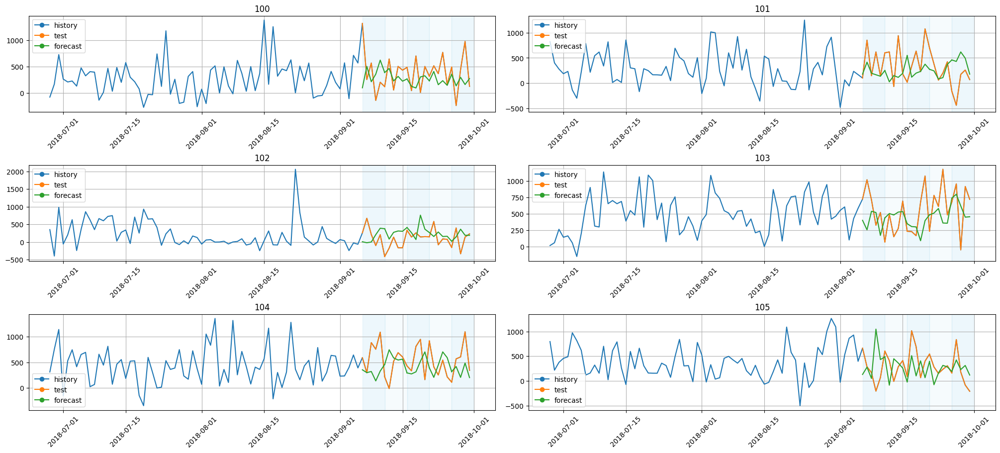

In [57]:
models = [ etna.models.CatBoostPerSegmentModel() for _ in horizons ]
do_backtest(
    etna.ensembles.DirectEnsemble(
        pipelines = etna.pipeline.assemble_pipelines(models = models, transforms = transforms_many, horizons = horizons),
        n_jobs = -1
    ),
    ts_nona
)

### Рекурсивная

In [68]:
transforms_recursive = [
    etna.transforms.LagTransform(in_column = "target", lags = list(range(1, 8, 1))),
    etna.transforms.SegmentEncoderTransform(),
    etna.transforms.DateFlagsTransform(
        day_number_in_week = True,
        day_number_in_month = True,
        month_number_in_year = True,
        season_number = True,
        is_weekend = True,
        out_column = "dateflag"
    ),
    etna.transforms.HolidayTransform(out_column = 'is_holiday', mode = 'binary'),
    etna.transforms.LagTransform(in_column = "is_holiday", lags = list(range(1, 8, 1))),
    etna.transforms.StandardScalerTransform()
]
tmp = etna.datasets.TSDataset(ts_nona.df.copy(), freq = kFreq)
tmp.fit_transform(transforms_recursive)
tmp.head()

segment                                                                        100  \
feature    LagTransform(in_column = 'is_holiday', lags = [1], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                                          -0.179993                        
2017-06-11                                          -0.179993                        
2017-06-12                                          -0.179993                        
2017-06-13                                           5.555778                        

segment                                                                             \
feature    LagTransform(in_column = 'is_holiday', lags = [2], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                                                NaN                        
2017-06-11                                          -0.180187                        
2017-06-12                                          -0.180187                        
2017-06-13                                          -0.180187                        

segment                                                                             \
feature    LagTransform(in_column = 'is_holiday', lags = [3], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                                                NaN                        
2017-06-11                                                NaN                        
2017-06-12                                          -0.180383                        
2017-06-13                                          -0.180383                        

segment                                                                             \
feature    LagTransform(in_column = 'is_holiday', lags = [4], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                                                NaN                        
2017-06-11                                                NaN                        
2017-06-12                                                NaN                        
2017-06-13                                          -0.180579                        

segment                                                                             \
feature    LagTransform(in_column = 'is_holiday', lags = [5], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                                                NaN                        
2017-06-11                                                NaN                        
2017-06-12                                                NaN                        
2017-06-13                                                NaN                        

segment                                                                             \
feature    LagTransform(in_column = 'is_holiday', lags = [6], out_column = None, )   
timestamp                                                                            
2017-06-09                                                NaN                        
2017-06-10                                                NaN                        
2017-06-11                                                NaN                        
2017-06-12                             

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   31.4s remaining:   47.1s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   42.0s remaining:   28.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   59.0s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   29.8s remaining:   44.8s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   42.4s remaining:   28.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.1min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   21.5s remaining:   32.3s
[Pa

,segment,MAE
0,100,258.790047
1,101,287.571038
2,102,229.734160
3,103,266.609007
4,104,241.511300
5,105,261.443604
6,106,79.606510
7,74,563.479328
8,85,256.203480
9,86,168.980824


Average:  266.3024816595497


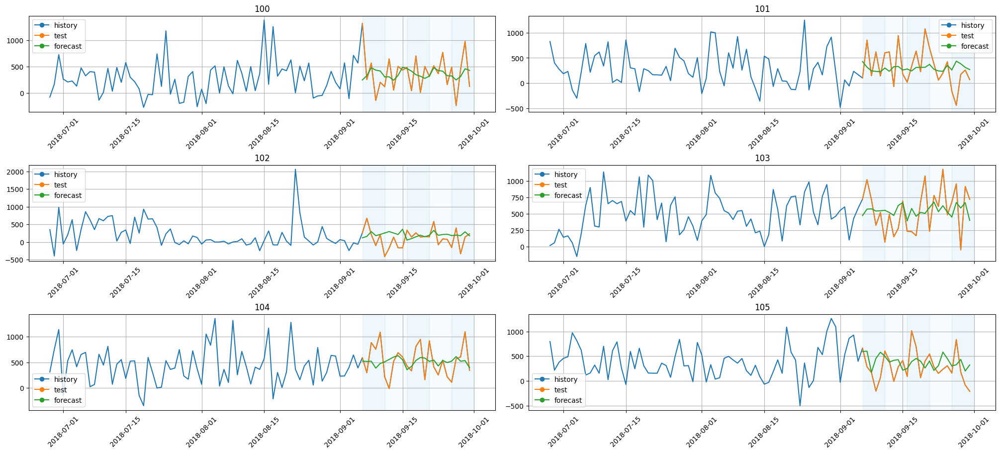

In [76]:
do_backtest(
    etna.pipeline.AutoRegressivePipeline(model = etna.models.ProphetModel(), transforms = transforms_recursive, horizon = HORIZON, step = 1),
    ts_nona
)

In [70]:
# AutoARIMAModel не работает, что, вообще говоря, ожидаемо: ARIMA и так является авторегрессивной моделью
try:
    do_backtest(
        etna.pipeline.AutoRegressivePipeline(model = etna.models.AutoARIMAModel(), transforms = transforms_recursive, horizon = HORIZON, step = 1),
        ts_nona
    )
except Exception as e:
    print(e)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  4.8min remaining:  7.2min
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:  5.0min remaining:  3.3min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  5.4min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.


Provided exogenous values are not of the appropriate shape. Required (2, 21), got (1, 21).


[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   17.5s remaining:   26.3s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   25.0s remaining:   16.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   39.9s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   18.7s remaining:   28.1s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   26.7s remaining:   17.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   42.9s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.6s remaining:   23.5s
[Pa

,segment,MAE
0,100,278.725302
1,101,267.845961
2,102,254.070571
3,103,311.906476
4,104,302.975562
5,105,237.495400
6,106,84.834103
7,74,650.412782
8,85,297.122020
9,86,161.189227


Average:  286.2964433991106


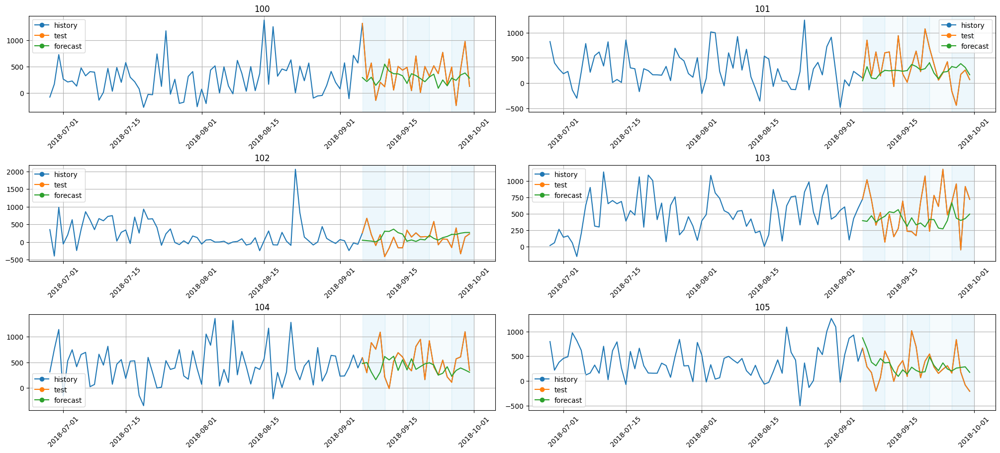

In [71]:
do_backtest(
    etna.pipeline.AutoRegressivePipeline(model = etna.models.CatBoostMultiSegmentModel(), transforms = transforms_recursive, horizon = HORIZON, step = 1),
    ts_nona
)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   55.7s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  1.2min remaining:  1.7min
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:  1.4min remaining:   54.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.6min finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   15.9s remaining:   23.9s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   23.6s remaining:   15.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   40.7s finished
[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   25.3s remaining:   38.0s
[Pa

,segment,MAE
0,100,285.293647
1,101,313.375591
2,102,341.489919
3,103,374.249312
4,104,340.871334
5,105,425.059212
6,106,86.303976
7,74,613.965381
8,85,346.948339
9,86,199.033154


Average:  321.16503755964703


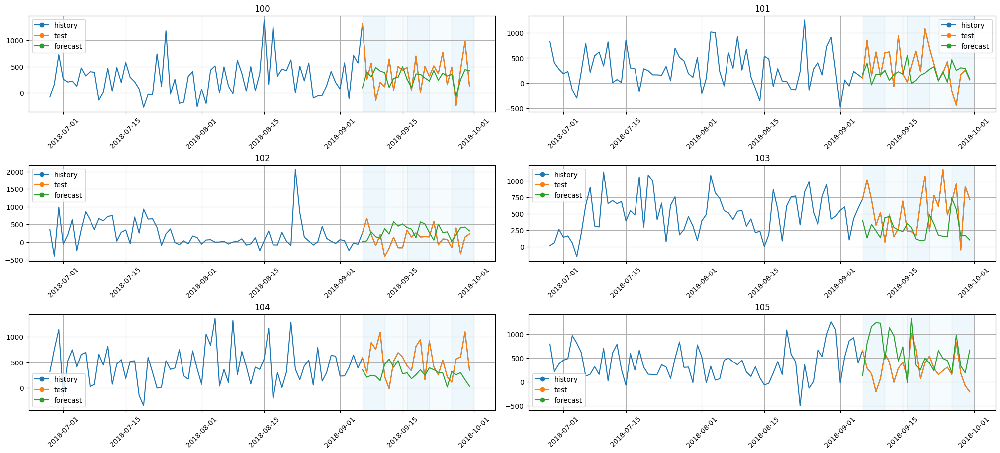

In [72]:
do_backtest(
    etna.pipeline.AutoRegressivePipeline(model = etna.models.CatBoostPerSegmentModel(), transforms = transforms_recursive, horizon = HORIZON, step = 5),
    ts_nona
)

### Вывод

<table>
    <tbody>
        <tr>
            <td></td>
            <td>Prophet</td>
            <td>AutoARIMA</td>
            <td>CatBoostMultiSegmentModel</td>
            <td>CatBoostPerSegmentModel</td>
            <td></td>
            <td>Среднее</td>
        </tr>
        <tr>
            <td>Прямая</td>
            <td>264.71</td>
            <td>280.70</td>
            <td>327.76</td>
            <td>304.25</td>
            <td></td>
            <td>294.36</td>
        </tr>
        <tr>
            <td>Прямая, STL</td>
            <td>384.89</td>
            <td>368.90</td>
            <td>383.02</td>
            <td>383.62</td>
            <td></td>
            <td>380.11</td>
        </tr>
        <tr>
            <td>Прямая, 3 модели</td>
            <td>266.61</td>
            <td>275.75</td>
            <td>282.85</td>
            <td>292.34</td>
            <td></td>
            <td>279.39</td>
        </tr>
        <tr>
            <td>Рекурсивная</td>
            <td>266.30</td>
            <td>-</td>
            <td>286.30</td>
            <td>321.17</td>
            <td></td>
            <td>291.26</td>
        </tr>
        <tr>
            <td></td>
            <td></td>
            <td></td>
            <td></td>
            <td></td>
            <td></td>
            <td></td>
        </tr>
        <tr>
            <td></td>
            <td>295.63</td>
            <td>308.45</td>
            <td>319.98</td>
            <td>325.35</td>
            <td></td>
            <td></td>
        </tr>
    </tbody>
</table>

1. Наилучшее качество показывает простейшая Prophet модель с прямой стратегией прогнозирования.
2. По совокупности всех рассмотренных моделей наилучшей стратегией оказалсь прямая с использованием 3-х моделей, хотя она и показывает чуть худшее качество для модели Prophet.
3. Хотя предсказания без STL и выглядят достаточно странно - практически просто горизонтальные линии, - по метрикам качества они не так плохи: MAE для результатов с STL оказалось значительно больше.
4. В целом, результаты достаточно близки по качеству.

Описанные закономерности говорят о высокой хаотичности исходных данных и трудности их прогнозирования.

## Задание 7. Ансамбли (1.25 балла)

Чтобы не выбирать лучшую модель, мы можем использовать преимущества каждой - давайте объединим все наши наработки в ансамбль. Попробуйте различные опции ансамблирования, и выберите ту, которая работает лучше всего (не забывайте, что внутри каждого ансамбля у нас тоже есть параметры, которые мы можем варьировать - веса в voting, включаемые признаки в stacking).

In [ ]:
from etna.ensembles import StackingEnsemble, VotingEnsemble

In [ ]:
#YOUR CODE HERE#

## Задание 8*. Трансформер (бонус 2 балла)

Для желающих протестировать мощь трансформенных моделей предлагается "завести" модель из второго семинара по временным рядам на текущем датасете. На этот раз абсолютно все необходимые импорты и зависимости подгружаются на ваше усмотрение. Удалось ли вам улучшить качество по сравнению с классическими моделями / моделями на основе ML? Что бы вы предпочли внедрить в production?

*NB:* все, конечно, прекрасно знают механизм работы бонусных заданий, но порядка ряди прописать дисклеймер должны - итоговый балл за домашнее задание ставится по формуле min(10, ваш суммарный балл за задания).

In [ ]:
#YOUR CODE HERE#